<div style="
font-size:22px;
font-weight:600;
color:#1F2933;
">
Requirements:
<div style="
font-size:18px;
font-weight:600;
color:#1F2933;
"> 
Compatible with data_handling.py and fit_FMR_class.py (currently only Generalizing-complex-fits branch)
<div style="
font-size:22px;
font-weight:600;
color:#1F2933;
">
V Original
<div style="
font-size:18px;
font-weight:600;
color:#1F2933;
"> 

In [2]:
#Fine tuned version

In [3]:
import h5py
import numpy as np 
import sys

import matplotlib.pyplot as plt

from pathlib import Path

sys.path.append(r"C:\Users\jose1\OneDrive\PostDoc_FZU\DATA_analysis\VNA_data\VNA_analysis")
from data_handling import Analysis_FMR, FitStore
import fit_FMR_class as models
import complex_fits as fits
import fitting_functions as funcs
import resonance_functions as res_func
import calculators as calcs

import ipywidgets as widgets
from ipywidgets import interact

from scipy.optimize import curve_fit

<div style="
font-size:22px;
font-weight:600;
color:#1F2933;
">
Files Information:
<div style="
font-size:18px;
font-weight:600;
color:#1F2933;
">
Fill in the information about the files to be analyzed. Create a class entity for each file with Analysis_PSWS()

In [5]:
#Folders where file are. Keep the r to use raw string in Windows.
address1 = Path(r"C:\Users\jose1\OneDrive\PostDoc_FZU\DATA\joseS\Sb2N2\inP\FMR_2026-06-09")

In [6]:
file_name_1 = "2026-06-09_FMR_fsw_0Ato19p5Ain81_0p5to50GHz_-10dBm_13-29_analisys.h5.ma8"

In [7]:
sample = "Sb2N2_inP_m10dBm"

In [8]:
geometry = "inP" #either "inP" or "outP"

In [9]:
vna_ref_subtracted = True #Was a reference already subtracted during measurements?

In [10]:
ansy1 = Analysis_FMR(address1, file_name_1, sample, "FZU_FMR", geometry, vna_ref_subtracted)

In [11]:
store_in_origin = True #True if you wnat to store fit results in orignal file, otherwise another h5f file is created in the same directory

In [12]:
if store_in_origin:
    newFile = ansy1.file
else:
    newfile_name =  s.replace(".h5.ma8", "_LorentzFits.h5")
    newFile = address1/newfile_name

fits_storage = FitStore (newFile, group="Lorentzian fitting")

<div style="
font-size:22px;
font-weight:600;
color:#1F2933;
">
Data visualization:
<div style="
font-size:18px;
font-weight:600;
color:#1F2933;
">
plot_dL_slider() allows one to preview the data for each field to select the best reference subraction.

In [57]:
ansy1.plot_dij_slider('d_S', n_0=5)

interactive(children=(IntSlider(value=5, description='Field index', max=80, readout_format='.0f'), Output()), …

In [15]:
#Ref. subtraction

In [16]:
ansy1.subtract_ref(single=False, fit=True, nb_g=1, ref_indx= 8) 
# ############It is saving a fuuuuull matrix of reference, no good

In [17]:
#Recheck data after new ref

In [18]:
# ansy1.plot_dij_slider('d_S', n_0=5)

In [19]:
# Example of a single fit

{'Ar': 9.105471460698533e-06, 'Ai': 0.0008156943024406626, 'fo': 33.7, 'df': 0.02, 're0': 0.0, 'im0': 0.0}
Initial simplex fit


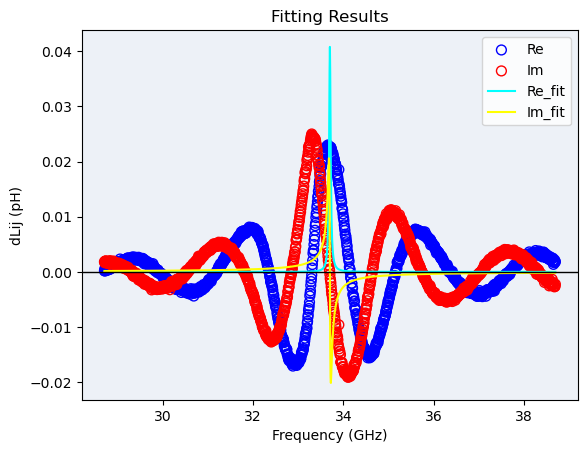

Final fit and results


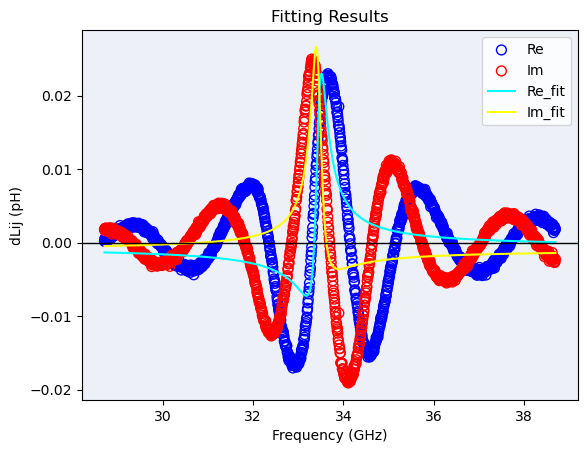


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0035      1.644e-04         U        No
Ai                        0.0024      1.644e-04         U        No
fo                       33.4413         0.0075       GHz        No
df                        0.1394         0.0075       GHz        No
re0                   -6.040e-04      1.713e-04         U        No
im0                   -9.791e-04      1.713e-04         U        No
----------------------------------------------------------------------
The phase is: 34.171228101402406


In [20]:
ini_vals = [1, 1, 35, 0.028, 0, 0] #A, w, fres, fper, fref, re0, im0
H_index = 41
f_center = 33.7

f_min, f_max = f_center-5, f_center+5 #GHz
f_array = ansy1.freqs

y_array_re, y_array_im = ansy1.d_S("21R")[H_index], ansy1.d_S("21I")[H_index]
#y_array_re, y_array_im = dS21_Re_dH[H_index], dS21_Im_dH[H_index]

model = models.ComplexLorentzian_freq()
fitter = fits.ComplexFitter( ini_vals, f_min, f_max,
    f_array, y_array_re , y_array_im, model)
fitter.fix(fo=f_center, df=0.02, re0=0, im0=0) # Parameters to be fixed, empty otherwise
opt_p0 = fitter.simplex_wpm(method='Nelder-Mead')#'Powell'
print(opt_p0)
print("Initial simplex fit")
fitter.plot_fit_simplex_wpm()

new_p0 = np.array(list(opt_p0.values()), dtype=float)
fitter.update_p0(new_p0)

params, cov = fitter.fit(simplex_b=False)
print("Final fit and results")
fitter.plot_fit()
fitter.summary()
print(f"The phase is: {model.phase_deg(**params)}")

In [21]:
#If we are happy with the fit, we can save it.

In [22]:
fit_dict = fitter.export_fit_dict()

fits_storage.save(index=H_index,field=float(ansy1.calc_field("inP")[H_index]),fit_dict=fit_dict)

In [23]:
# Automatic fitting of entire spectra. Enter the estimated parameters for the Kittel model guiding the automatic fitting.

Index= 0, Guide freq.=51.04100111668757


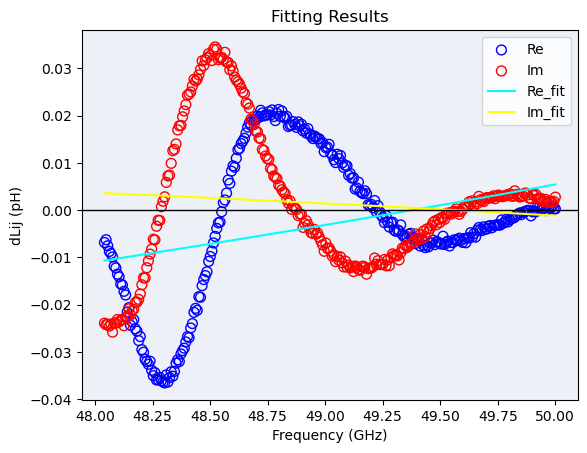


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -3.7812        56.8035         U        No
Ai                       -0.3699        56.8035         U        No
fo                       70.0000       157.2866       GHz        No
df                        2.0000       157.2869       GHz        No
re0                      -0.1799         1.3491         U        No
im0                       0.0359         1.3491         U        No
----------------------------------------------------------------------
Index= 1, Guide freq.=50.730744507207014


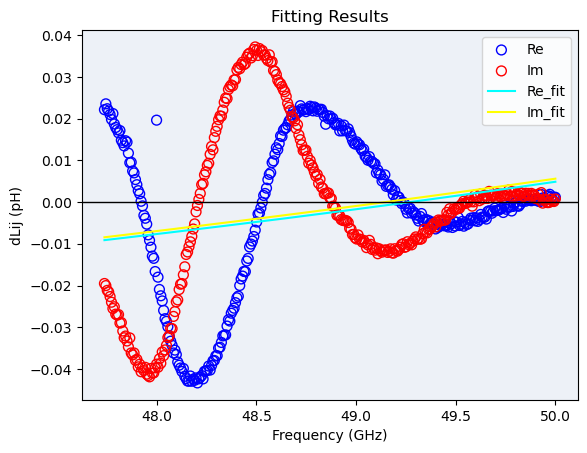


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -2.2027        51.4195         U        No
Ai                        3.2604        51.4194         U        No
fo                       70.0000       138.3930       GHz        No
df                        2.0000       138.3927       GHz        No
re0                      -0.1203         1.2130         U        No
im0                      -0.1449         1.2130         U        No
----------------------------------------------------------------------
Index= 2, Guide freq.=50.3987365531302


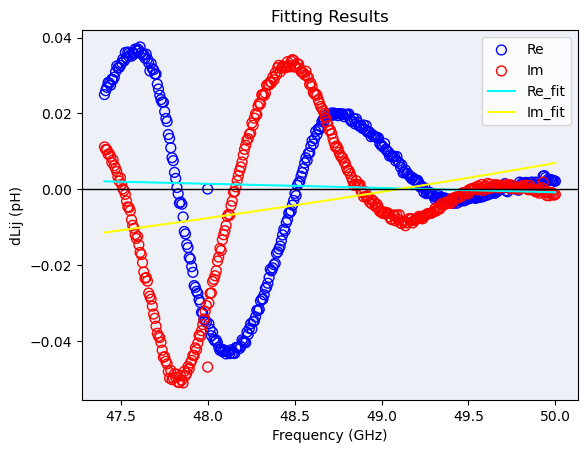


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        1.1006        41.0866         U        No
Ai                        3.0689        41.0864         U        No
fo                       70.0000       134.4117       GHz        No
df                        2.0000       134.4117       GHz        No
re0                       0.0385         0.9621         U        No
im0                      -0.1505         0.9621         U        No
----------------------------------------------------------------------
Index= 3, Guide freq.=50.05657824366447


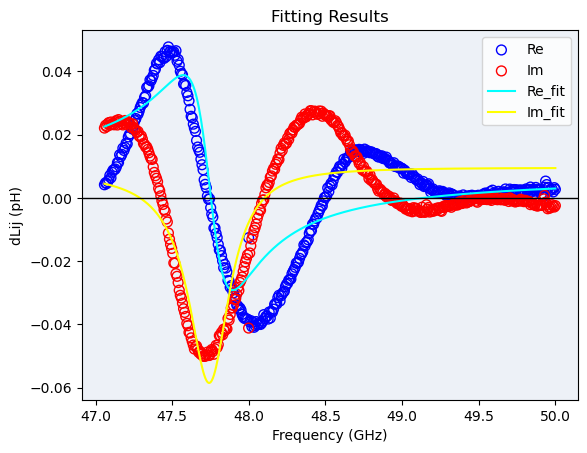


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0109      4.120e-04         U        No
Ai                    -9.700e-04      4.120e-04         U        No
fo                       47.7484         0.0074       GHz        No
df                        0.1615         0.0074       GHz        No
re0                       0.0078      6.751e-04         U        No
im0                       0.0093      6.751e-04         U        No
----------------------------------------------------------------------
Index= 4, Guide freq.=49.717418700753406


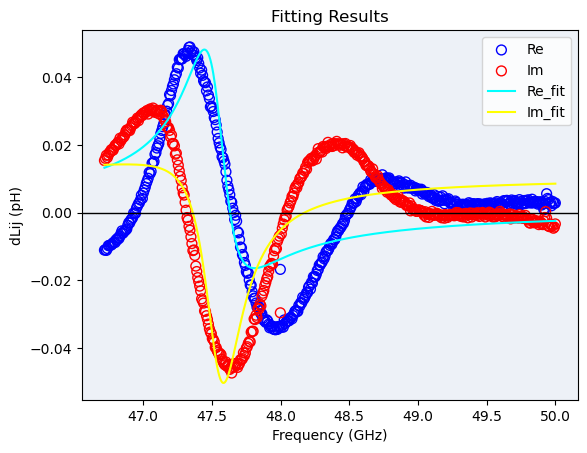


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0094      3.868e-04         U        No
Ai                        0.0048      3.868e-04         U        No
fo                       47.5459         0.0074       GHz        No
df                        0.1629         0.0074       GHz        No
re0                       0.0013      6.063e-04         U        No
im0                       0.0108      6.063e-04         U        No
----------------------------------------------------------------------
Index= 5, Guide freq.=49.381554453745146


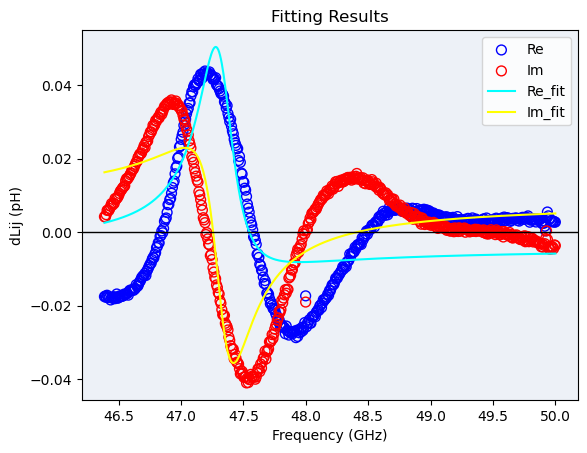


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0050      3.717e-04         U        No
Ai                        0.0086      3.717e-04         U        No
fo                       47.3237         0.0079       GHz        No
df                        0.1688         0.0079       GHz        No
re0                      -0.0042      5.493e-04         U        No
im0                       0.0084      5.493e-04         U        No
----------------------------------------------------------------------
Index= 6, Guide freq.=48.987980745721785


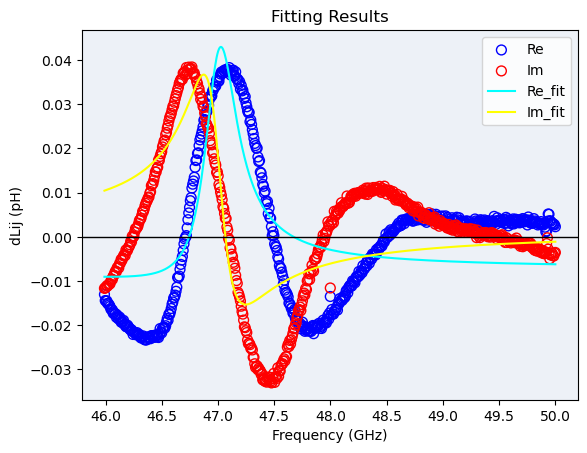


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0032      3.654e-04         U        No
Ai                        0.0085      3.654e-04         U        No
fo                       46.9947         0.0089       GHz        No
df                        0.1750         0.0089       GHz        No
re0                      -0.0074      5.053e-04         U        No
im0                       0.0017      5.053e-04         U        No
----------------------------------------------------------------------
Index= 7, Guide freq.=48.610661903215146


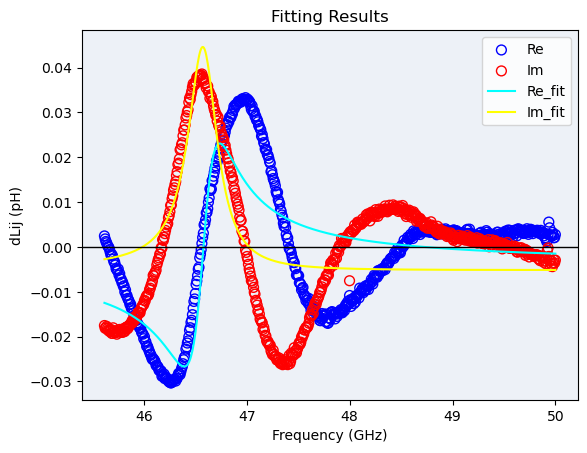


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0086      3.446e-04         U        No
Ai                     7.562e-04      3.446e-04         U        No
fo                       46.5793         0.0088       GHz        No
df                        0.1728         0.0088       GHz        No
re0                      -0.0040      4.591e-04         U        No
im0                      -0.0050      4.591e-04         U        No
----------------------------------------------------------------------
Index= 8, Guide freq.=48.23577426928147


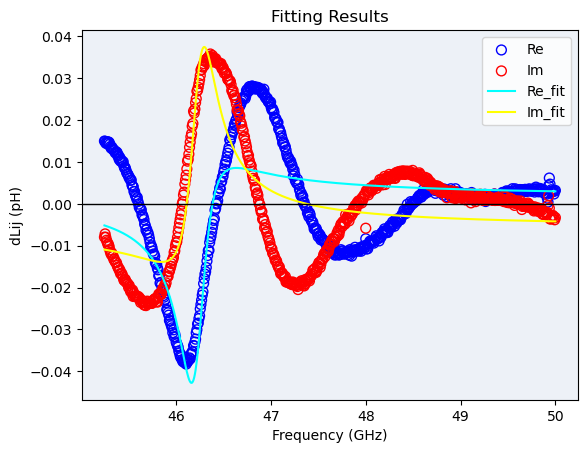


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0058      3.108e-04         U        No
Ai                       -0.0061      3.108e-04         U        No
fo                       46.2244         0.0078       GHz        No
df                        0.1629         0.0078       GHz        No
re0                       0.0015      4.123e-04         U        No
im0                      -0.0059      4.123e-04         U        No
----------------------------------------------------------------------
Index= 9, Guide freq.=47.79581109030893


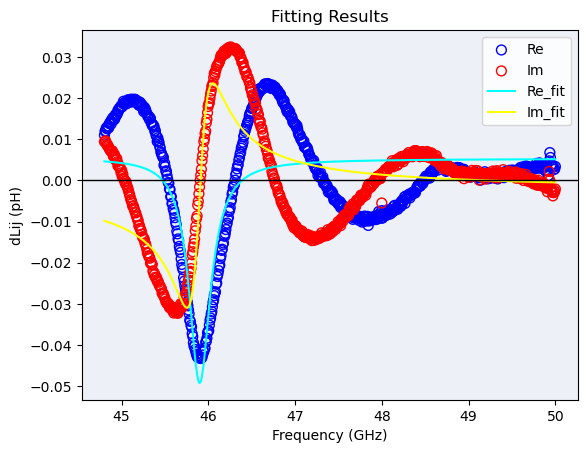


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                    -3.604e-04      2.829e-04         U        No
Ai                       -0.0082      2.829e-04         U        No
fo                       45.8967         0.0068       GHz        No
df                        0.1500         0.0068       GHz        No
re0                       0.0053      3.788e-04         U        No
im0                      -0.0025      3.788e-04         U        No
----------------------------------------------------------------------
Index= 10, Guide freq.=47.39211366984945


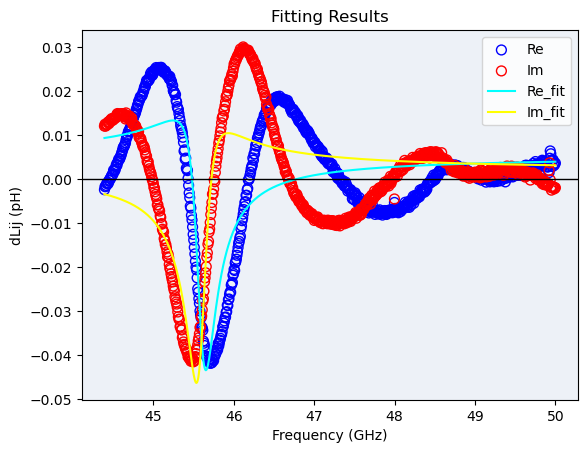


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0057      2.699e-04         U        No
Ai                       -0.0058      2.699e-04         U        No
fo                       45.5960         0.0063       GHz        No
df                        0.1425         0.0063       GHz        No
re0                       0.0053      3.598e-04         U        No
im0                       0.0019      3.598e-04         U        No
----------------------------------------------------------------------
Index= 11, Guide freq.=46.91948943158659


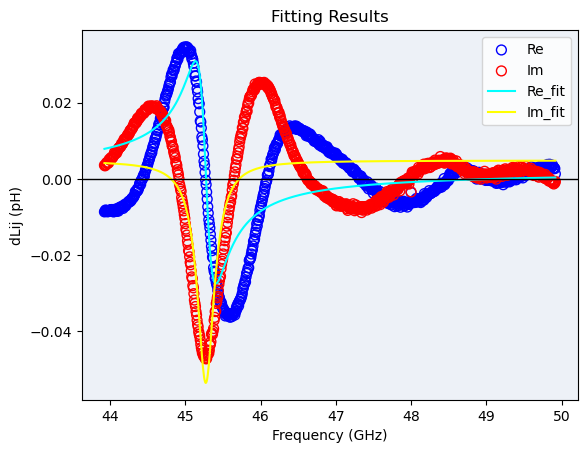


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0079      2.576e-04         U        No
Ai                    -9.436e-05      2.576e-04         U        No
fo                       45.2724         0.0059       GHz        No
df                        0.1357         0.0059       GHz        No
re0                       0.0021      3.430e-04         U        No
im0                       0.0048      3.430e-04         U        No
----------------------------------------------------------------------
Index= 12, Guide freq.=46.468336613247466


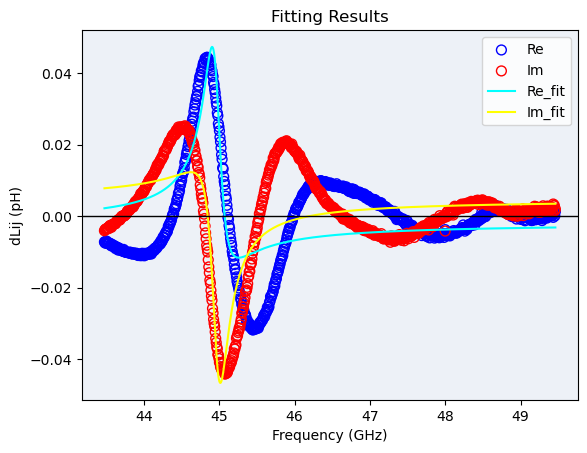


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0057      2.511e-04         U        No
Ai                        0.0052      2.511e-04         U        No
fo                       44.9616         0.0057       GHz        No
df                        0.1315         0.0057       GHz        No
re0                      -0.0019      3.411e-04         U        No
im0                       0.0047      3.411e-04         U        No
----------------------------------------------------------------------
Index= 13, Guide freq.=46.00364195546129


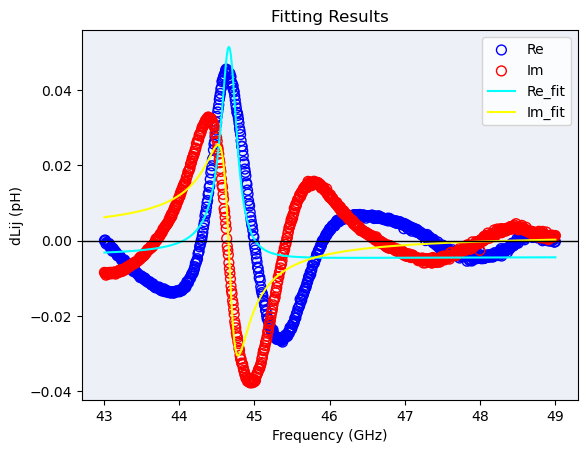


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0012      2.486e-04         U        No
Ai                        0.0073      2.486e-04         U        No
fo                       44.6719         0.0059       GHz        No
df                        0.1313         0.0059       GHz        No
re0                      -0.0042      3.386e-04         U        No
im0                       0.0020      3.386e-04         U        No
----------------------------------------------------------------------
Index= 14, Guide freq.=45.506297382454555


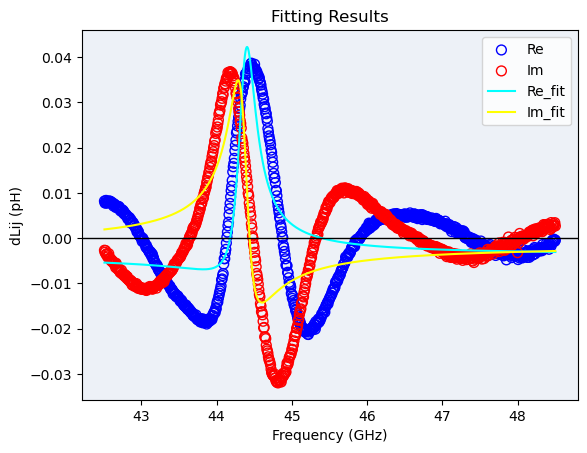


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0033      2.535e-04         U        No
Ai                        0.0060      2.535e-04         U        No
fo                       44.3701         0.0069       GHz        No
df                        0.1391         0.0069       GHz        No
re0                      -0.0039      3.357e-04         U        No
im0                      -0.0014      3.357e-04         U        No
----------------------------------------------------------------------
Index= 15, Guide freq.=45.03801681677117


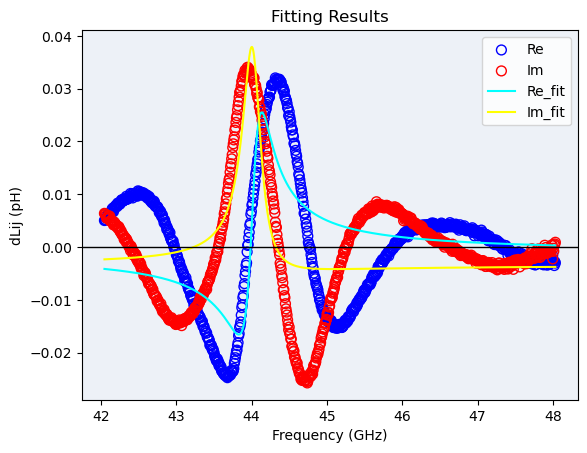


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0060      2.571e-04         U        No
Ai                        0.0017      2.571e-04         U        No
fo                       44.0221         0.0081       GHz        No
df                        0.1475         0.0081       GHz        No
re0                      -0.0012      3.303e-04         U        No
im0                      -0.0034      3.303e-04         U        No
----------------------------------------------------------------------
Index= 16, Guide freq.=44.539936738201575


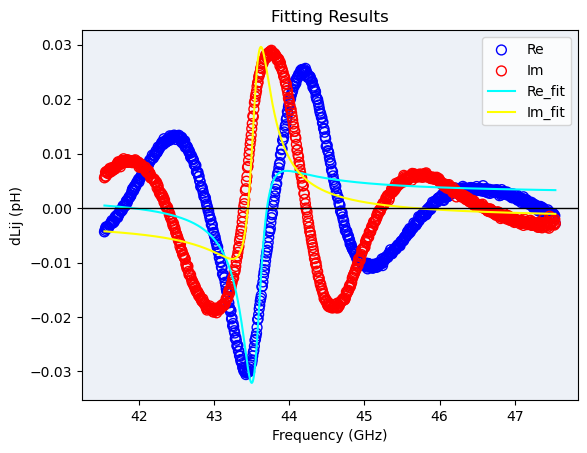


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0036      2.506e-04         U        No
Ai                       -0.0044      2.506e-04         U        No
fo                       43.5539         0.0086       GHz        No
df                        0.1474         0.0086       GHz        No
re0                       0.0024      3.221e-04         U        No
im0                      -0.0022      3.221e-04         U        No
----------------------------------------------------------------------
Index= 17, Guide freq.=44.01271869301378


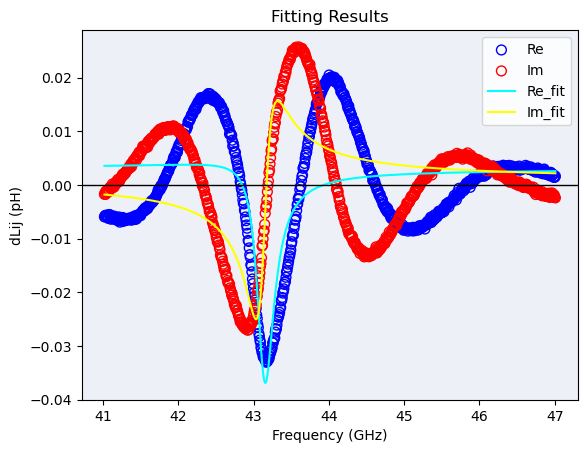


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0015      2.352e-04         U        No
Ai                       -0.0054      2.352e-04         U        No
fo                       43.1374         0.0078       GHz        No
df                        0.1380         0.0078       GHz        No
re0                       0.0030      3.135e-04         U        No
im0                    7.879e-04      3.135e-04         U        No
----------------------------------------------------------------------
Index= 18, Guide freq.=43.4790788307328


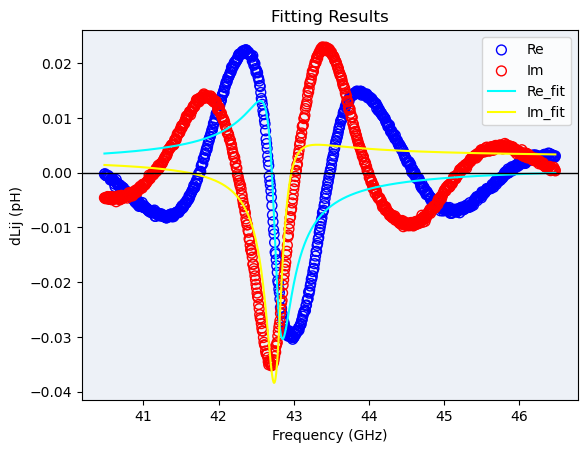


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0051      2.285e-04         U        No
Ai                       -0.0026      2.285e-04         U        No
fo                       42.7706         0.0071       GHz        No
df                        0.1317         0.0071       GHz        No
re0                       0.0014      3.125e-04         U        No
im0                       0.0027      3.125e-04         U        No
----------------------------------------------------------------------
Index= 19, Guide freq.=42.94130074912042


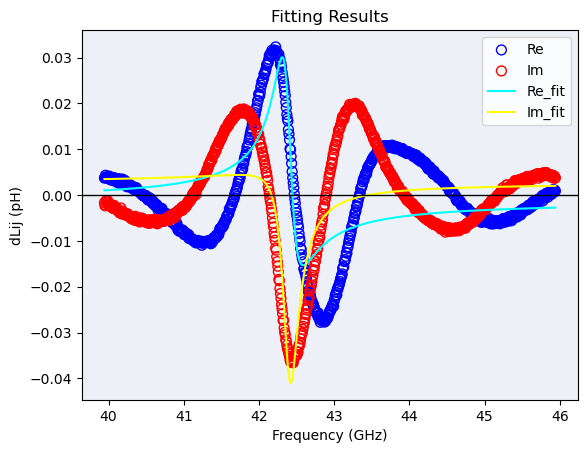


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0054      2.299e-04         U        No
Ai                        0.0022      2.299e-04         U        No
fo                       42.3957         0.0068       GHz        No
df                        0.1293         0.0068       GHz        No
re0                      -0.0012      3.176e-04         U        No
im0                       0.0027      3.176e-04         U        No
----------------------------------------------------------------------
Index= 20, Guide freq.=42.42331083451454


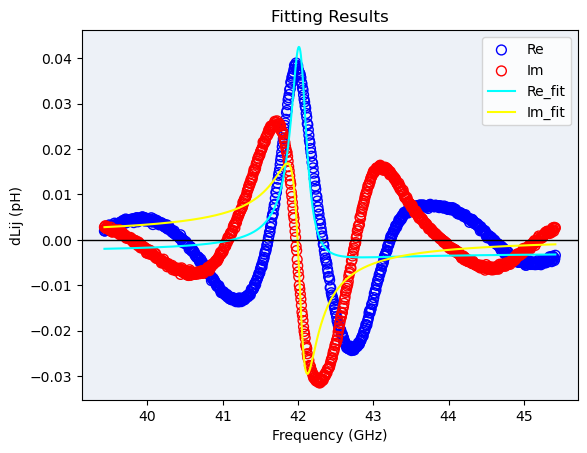


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0018      2.280e-04         U        No
Ai                        0.0056      2.280e-04         U        No
fo                       42.0314         0.0066       GHz        No
df                        0.1267         0.0066       GHz        No
re0                      -0.0028      3.187e-04         U        No
im0                    6.795e-04      3.187e-04         U        No
----------------------------------------------------------------------
Index= 21, Guide freq.=41.92725008116154


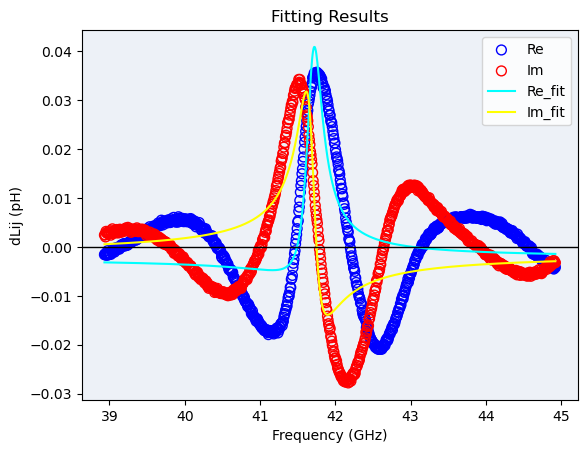


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0026      2.266e-04         U        No
Ai                        0.0052      2.266e-04         U        No
fo                       41.6920         0.0067       GHz        No
df                        0.1267         0.0067       GHz        No
re0                      -0.0023      3.169e-04         U        No
im0                      -0.0014      3.169e-04         U        No
----------------------------------------------------------------------
Index= 22, Guide freq.=41.36911957046391


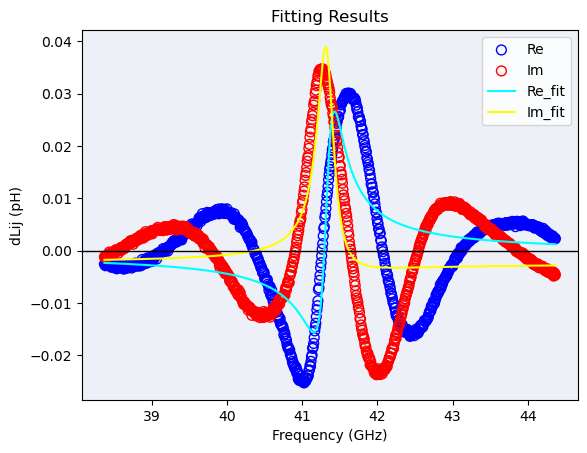


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0053      2.293e-04         U        No
Ai                        0.0016      2.293e-04         U        No
fo                       41.3322         0.0073       GHz        No
df                        0.1321         0.0073       GHz        No
re0                   -5.705e-04      3.137e-04         U        No
im0                      -0.0024      3.137e-04         U        No
----------------------------------------------------------------------
Index= 23, Guide freq.=40.85836460965563


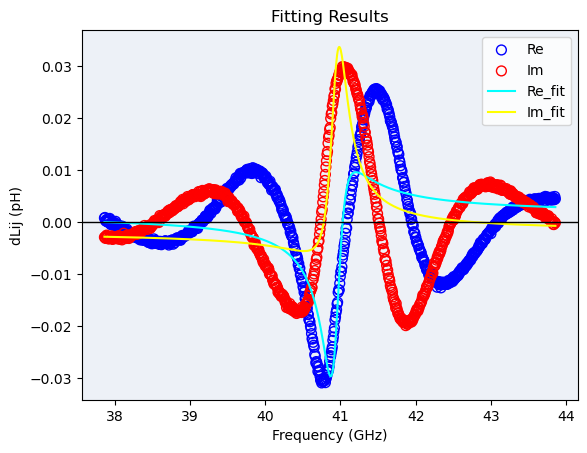


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0043      2.284e-04         U        No
Ai                       -0.0031      2.284e-04         U        No
fo                       40.9404         0.0078       GHz        No
df                        0.1361         0.0078       GHz        No
re0                       0.0015      3.076e-04         U        No
im0                      -0.0019      3.076e-04         U        No
----------------------------------------------------------------------
Index= 24, Guide freq.=40.35359828291721


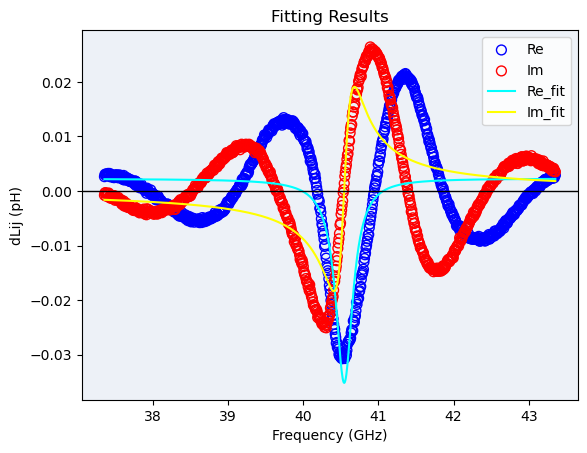


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     1.013e-04      2.230e-04         U        No
Ai                       -0.0051      2.230e-04         U        No
fo                       40.5463         0.0080       GHz        No
df                        0.1370         0.0080       GHz        No
re0                       0.0023      2.991e-04         U        No
im0                    9.574e-07      2.991e-04         U        No
----------------------------------------------------------------------
Index= 25, Guide freq.=39.83572658335443


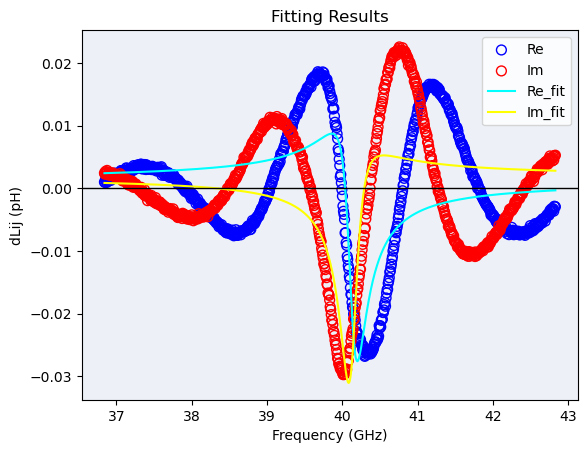


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0041      2.200e-04         U        No
Ai                       -0.0029      2.200e-04         U        No
fo                       40.1288         0.0081       GHz        No
df                        0.1377         0.0081       GHz        No
re0                       0.0012      2.944e-04         U        No
im0                       0.0018      2.944e-04         U        No
----------------------------------------------------------------------
Index= 26, Guide freq.=39.36756018294258


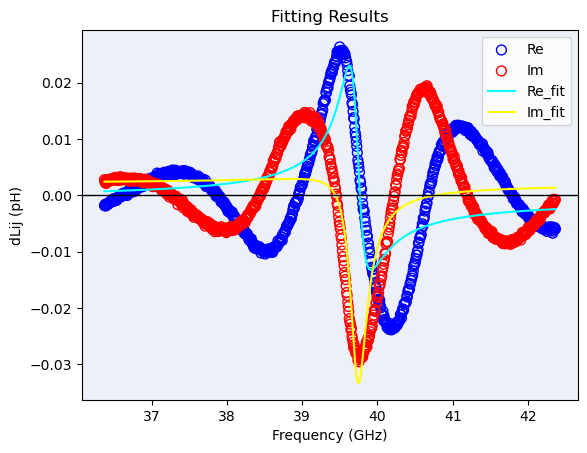


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0047      2.169e-04         U        No
Ai                        0.0015      2.169e-04         U        No
fo                       39.7260         0.0081       GHz        No
df                        0.1363         0.0081       GHz        No
re0                   -7.015e-04      2.918e-04         U        No
im0                       0.0020      2.918e-04         U        No
----------------------------------------------------------------------
Index= 27, Guide freq.=38.84887844500286


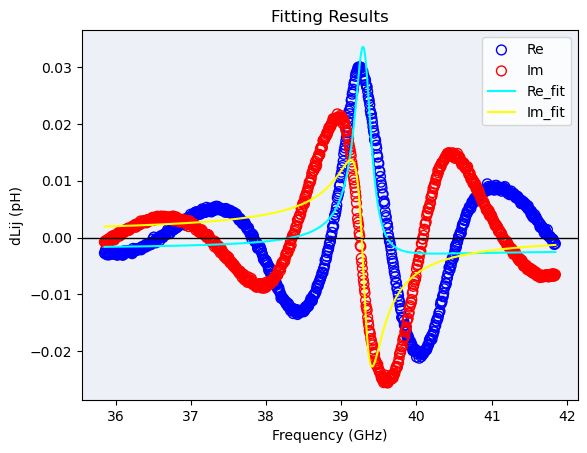


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0014      2.172e-04         U        No
Ai                        0.0047      2.172e-04         U        No
fo                       39.3078         0.0080       GHz        No
df                        0.1356         0.0080       GHz        No
re0                      -0.0021      2.927e-04         U        No
im0                    5.997e-04      2.927e-04         U        No
----------------------------------------------------------------------
Index= 28, Guide freq.=38.38062015627401


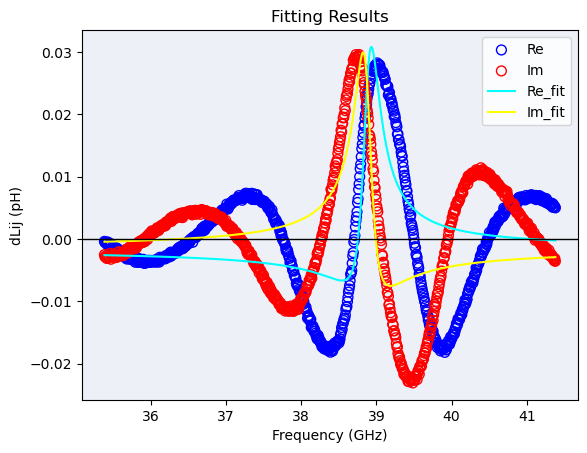


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0034      2.168e-04         U        No
Ai                        0.0037      2.168e-04         U        No
fo                       38.8814         0.0078       GHz        No
df                        0.1330         0.0078       GHz        No
re0                      -0.0017      2.951e-04         U        No
im0                      -0.0015      2.951e-04         U        No
----------------------------------------------------------------------
Index= 29, Guide freq.=37.92269747502674


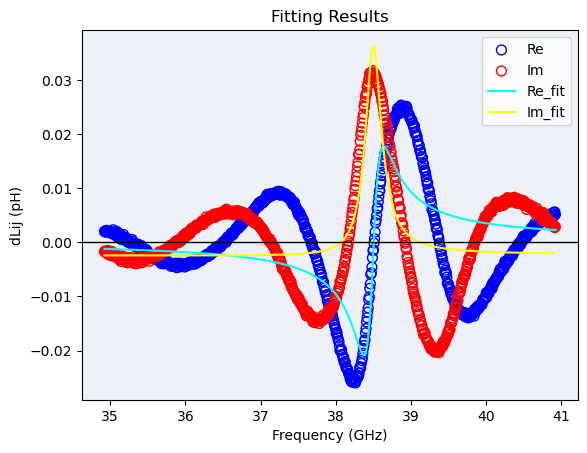


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0051      2.162e-04         U        No
Ai                    -4.737e-04      2.162e-04         U        No
fo                       38.4932         0.0075       GHz        No
df                        0.1318         0.0075       GHz        No
re0                    2.104e-04      2.956e-04         U        No
im0                      -0.0023      2.956e-04         U        No
----------------------------------------------------------------------
Index= 30, Guide freq.=37.45656383026963


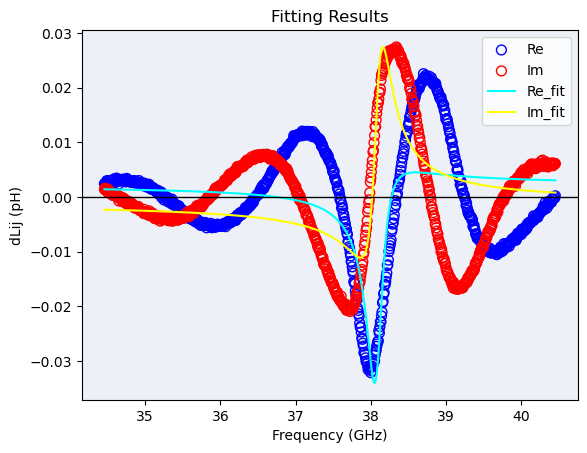


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0024      2.171e-04         U        No
Ai                       -0.0044      2.171e-04         U        No
fo                       38.0833         0.0076       GHz        No
df                        0.1313         0.0076       GHz        No
re0                       0.0021      2.973e-04         U        No
im0                      -0.0011      2.973e-04         U        No
----------------------------------------------------------------------
Index= 31, Guide freq.=37.03710444928459


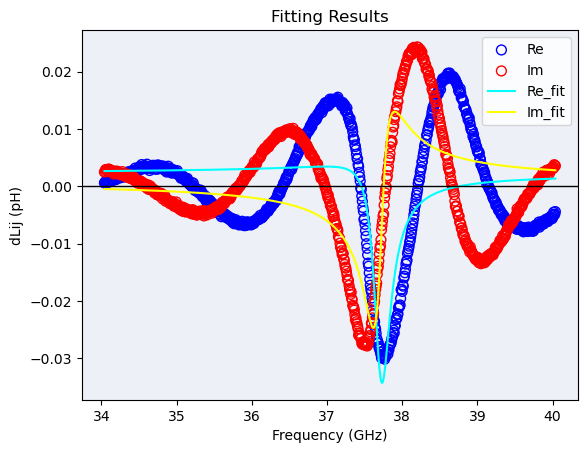


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0018      2.184e-04         U        No
Ai                       -0.0047      2.184e-04         U        No
fo                       37.7075         0.0078       GHz        No
df                        0.1330         0.0078       GHz        No
re0                       0.0022      2.972e-04         U        No
im0                    8.480e-04      2.972e-04         U        No
----------------------------------------------------------------------
Index= 32, Guide freq.=36.590599691623126


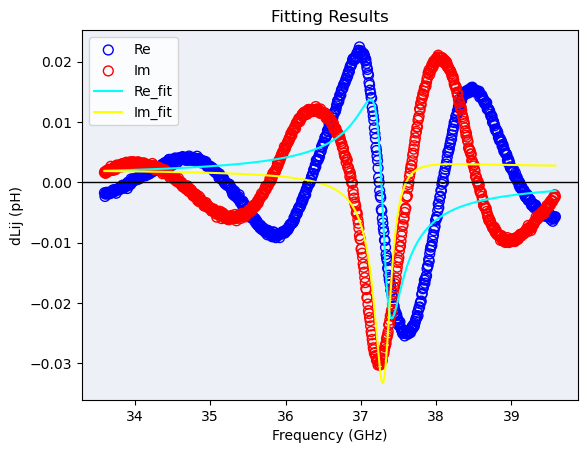


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0047      2.187e-04         U        No
Ai                       -0.0014      2.187e-04         U        No
fo                       37.3093         0.0081       GHz        No
df                        0.1350         0.0081       GHz        No
re0                    6.682e-04      2.952e-04         U        No
im0                       0.0023      2.952e-04         U        No
----------------------------------------------------------------------
Index= 33, Guide freq.=36.17017748830236


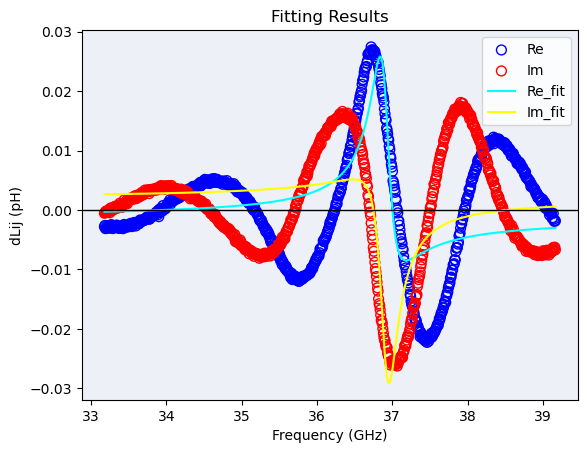


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0039      2.217e-04         U        No
Ai                        0.0028      2.217e-04         U        No
fo                       36.9117         0.0087       GHz        No
df                        0.1400         0.0087       GHz        No
re0                      -0.0014      2.935e-04         U        No
im0                       0.0019      2.935e-04         U        No
----------------------------------------------------------------------
Index= 34, Guide freq.=35.739462884356335


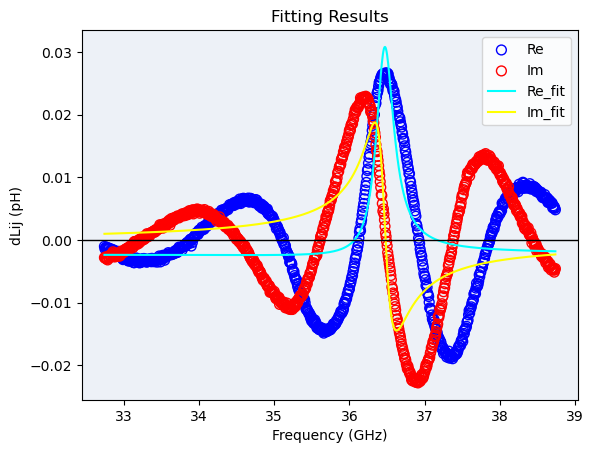


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     6.901e-04      2.228e-04         U        No
Ai                        0.0047      2.228e-04         U        No
fo                       36.4609         0.0090       GHz        No
df                        0.1422         0.0090       GHz        No
re0                      -0.0022      2.926e-04         U        No
im0                   -2.861e-04      2.926e-04         U        No
----------------------------------------------------------------------
Index= 35, Guide freq.=35.31454817945625


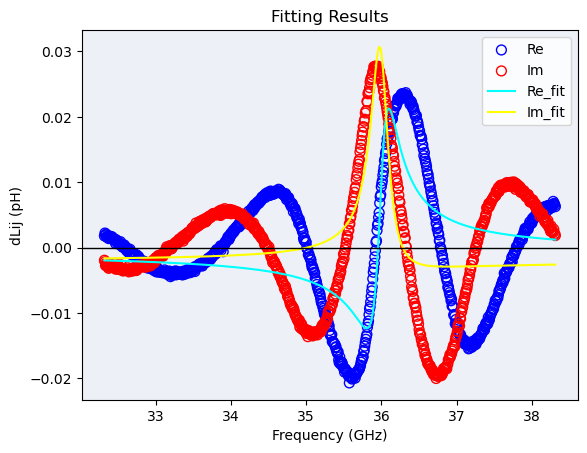


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0045      2.196e-04         U        No
Ai                        0.0015      2.196e-04         U        No
fo                       35.9976         0.0088       GHz        No
df                        0.1406         0.0088       GHz        No
re0                   -7.480e-04      2.902e-04         U        No
im0                      -0.0021      2.902e-04         U        No
----------------------------------------------------------------------
Index= 36, Guide freq.=34.91047246392355


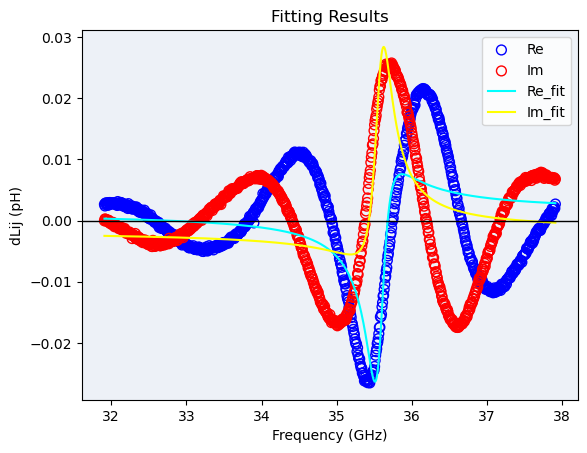


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0037      2.187e-04         U        No
Ai                       -0.0030      2.187e-04         U        No
fo                       35.5751         0.0086       GHz        No
df                        0.1398         0.0086       GHz        No
re0                       0.0013      2.898e-04         U        No
im0                      -0.0017      2.898e-04         U        No
----------------------------------------------------------------------
Index= 37, Guide freq.=34.52525571997262


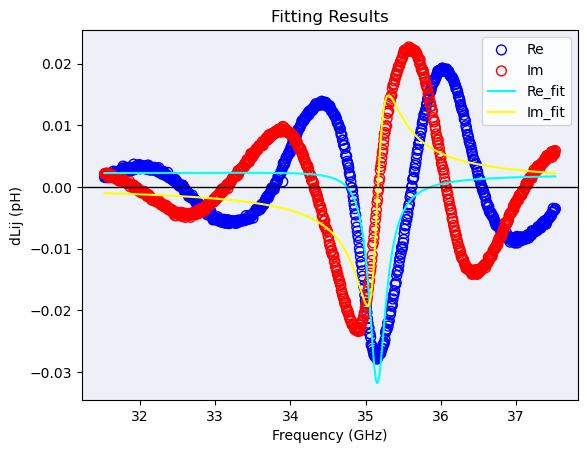


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                    -6.905e-04      2.170e-04         U        No
Ai                       -0.0047      2.170e-04         U        No
fo                       35.1435         0.0085       GHz        No
df                        0.1380         0.0085       GHz        No
re0                       0.0021      2.897e-04         U        No
im0                    2.920e-04      2.897e-04         U        No
----------------------------------------------------------------------
Index= 38, Guide freq.=34.1070995331479


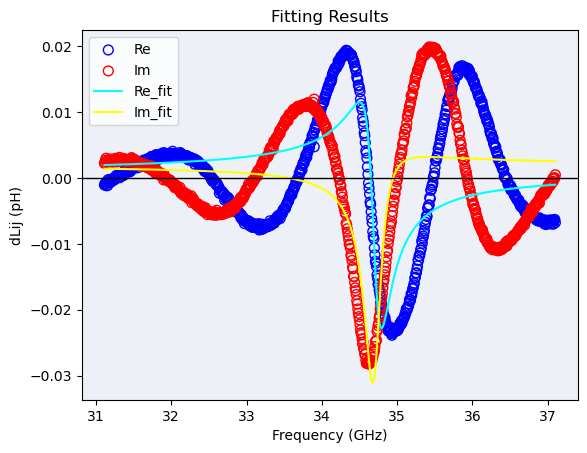


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0043      2.115e-04         U        No
Ai                       -0.0017      2.115e-04         U        No
fo                       34.7017         0.0083       GHz        No
df                        0.1348         0.0083       GHz        No
re0                    8.050e-04      2.860e-04         U        No
im0                       0.0019      2.860e-04         U        No
----------------------------------------------------------------------
Index= 39, Guide freq.=33.6877939593476


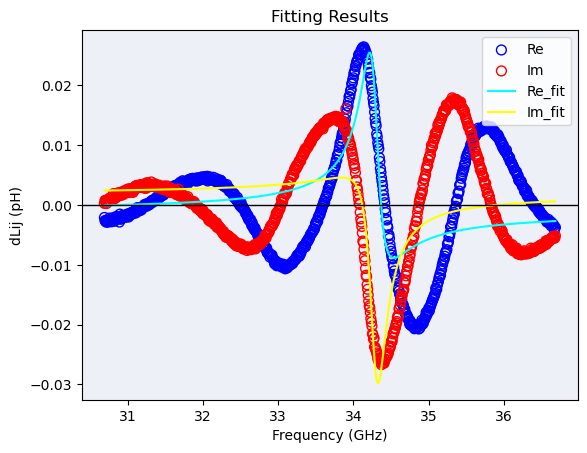


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0038      2.079e-04         U        No
Ai                        0.0025      2.079e-04         U        No
fo                       34.2865         0.0081       GHz        No
df                        0.1335         0.0081       GHz        No
re0                      -0.0012      2.825e-04         U        No
im0                       0.0018      2.825e-04         U        No
----------------------------------------------------------------------
Index= 40, Guide freq.=33.28263673120447


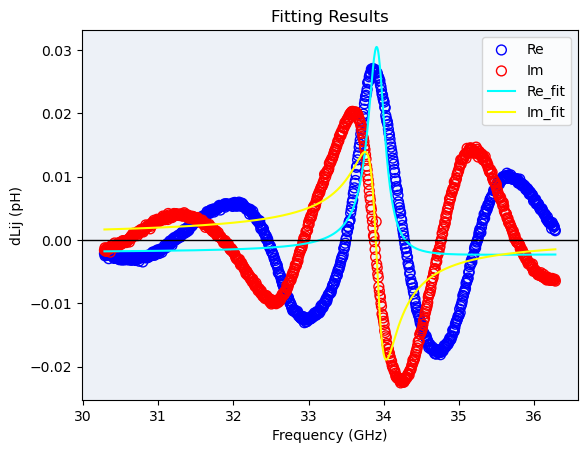


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                    -8.134e-04      2.108e-04         U        No
Ai                        0.0045      2.108e-04         U        No
fo                       33.9169         0.0086       GHz        No
df                        0.1388         0.0086       GHz        No
re0                      -0.0021      2.805e-04         U        No
im0                    4.382e-04      2.805e-04         U        No
----------------------------------------------------------------------
Index= 41, Guide freq.=32.85642940103081


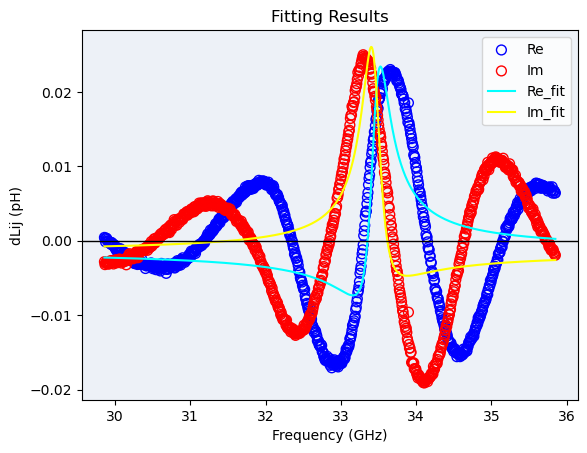


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0036      2.175e-04         U        No
Ai                        0.0027      2.175e-04         U        No
fo                       33.4545         0.0095       GHz        No
df                        0.1458         0.0095       GHz        No
re0                      -0.0013      2.820e-04         U        No
im0                      -0.0015      2.820e-04         U        No
----------------------------------------------------------------------
Index= 42, Guide freq.=32.44211684354272


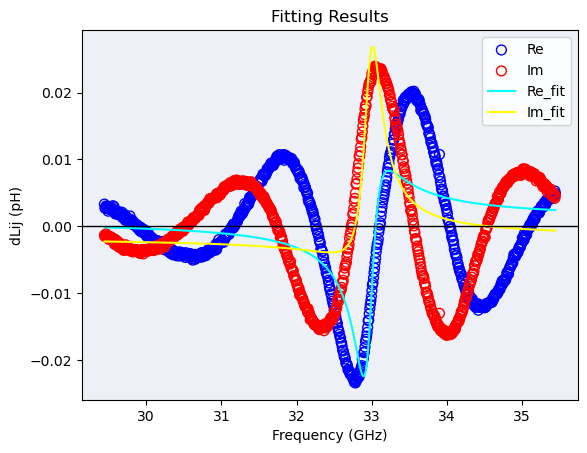


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0038      2.133e-04         U        No
Ai                       -0.0023      2.133e-04         U        No
fo                       32.9701         0.0093       GHz        No
df                        0.1441         0.0093       GHz        No
re0                    9.542e-04      2.783e-04         U        No
im0                      -0.0017      2.783e-04         U        No
----------------------------------------------------------------------
Index= 43, Guide freq.=32.00421599555683


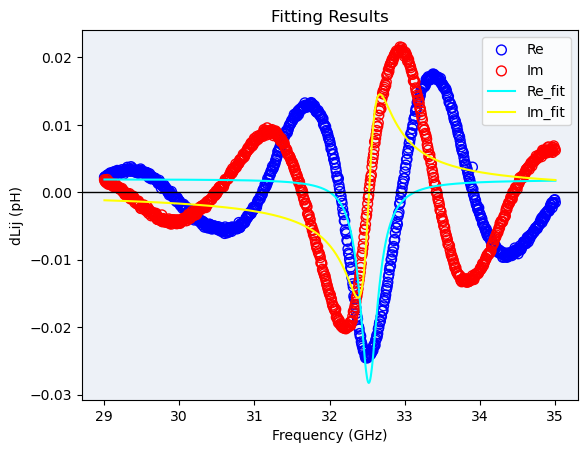


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                    -1.832e-04      2.127e-04         U        No
Ai                       -0.0044      2.127e-04         U        No
fo                       32.5173         0.0094       GHz        No
df                        0.1455         0.0094       GHz        No
re0                       0.0019      2.761e-04         U        No
im0                    6.756e-05      2.761e-04         U        No
----------------------------------------------------------------------
Index= 44, Guide freq.=31.577124896503253


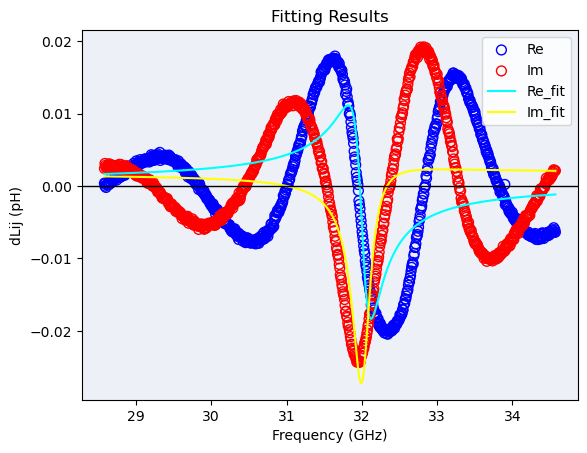


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0041      2.129e-04         U        No
Ai                       -0.0012      2.129e-04         U        No
fo                       32.0118         0.0097       GHz        No
df                        0.1456         0.0097       GHz        No
re0                    4.867e-04      2.764e-04         U        No
im0                       0.0017      2.764e-04         U        No
----------------------------------------------------------------------
Index= 45, Guide freq.=31.14312190079291


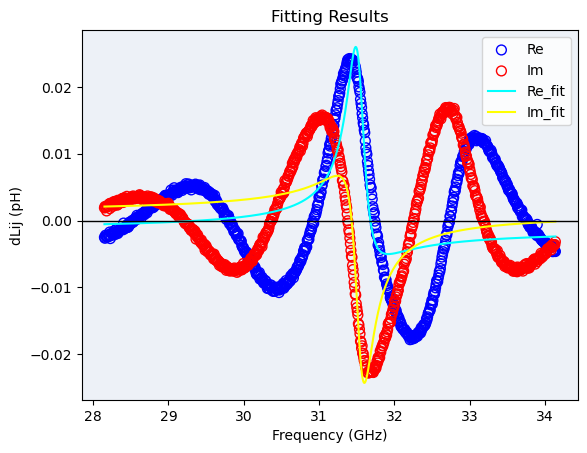


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0028      2.026e-04         U        No
Ai                        0.0033      2.026e-04         U        No
fo                       31.5374         0.0088       GHz        No
df                        0.1383         0.0088       GHz        No
re0                      -0.0014      2.704e-04         U        No
im0                       0.0012      2.704e-04         U        No
----------------------------------------------------------------------
Index= 46, Guide freq.=30.683622928159192


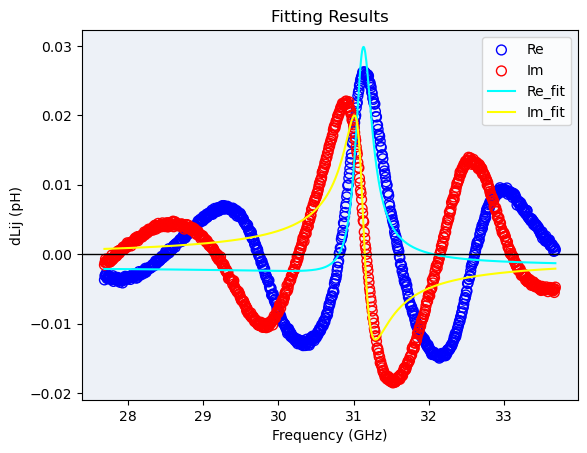


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0012      1.954e-04         U        No
Ai                        0.0042      1.954e-04         U        No
fo                       31.1126         0.0081       GHz        No
df                        0.1348         0.0081       GHz        No
re0                      -0.0018      2.643e-04         U        No
im0                   -4.752e-04      2.643e-04         U        No
----------------------------------------------------------------------
Index= 47, Guide freq.=30.235603100283196


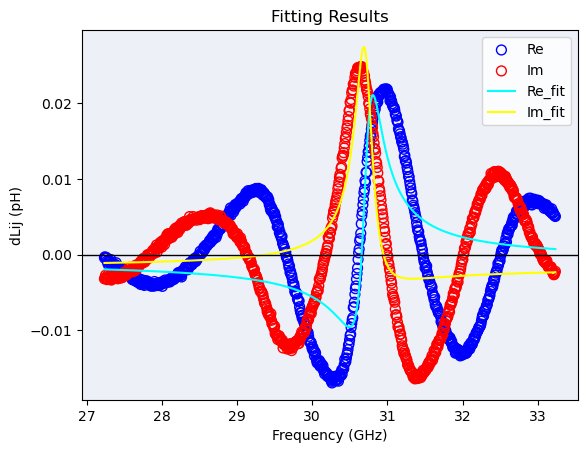


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0039      1.995e-04         U        No
Ai                        0.0019      1.995e-04         U        No
fo                       30.7190         0.0087       GHz        No
df                        0.1410         0.0087       GHz        No
re0                   -8.680e-04      2.633e-04         U        No
im0                      -0.0017      2.633e-04         U        No
----------------------------------------------------------------------
Index= 48, Guide freq.=29.781279787622733


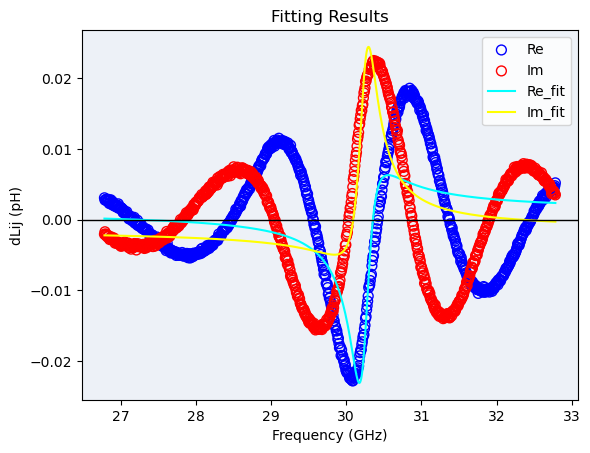


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0033      2.041e-04         U        No
Ai                       -0.0028      2.041e-04         U        No
fo                       30.2421         0.0093       GHz        No
df                        0.1465         0.0093       GHz        No
re0                       0.0011      2.640e-04         U        No
im0                      -0.0014      2.640e-04         U        No
----------------------------------------------------------------------
Index= 49, Guide freq.=29.302032780644492


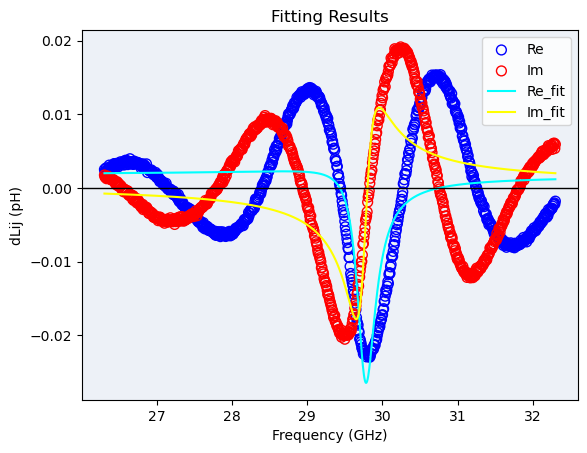


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0011      2.030e-04         U        No
Ai                       -0.0041      2.030e-04         U        No
fo                       29.7629         0.0095       GHz        No
df                        0.1474         0.0095       GHz        No
re0                       0.0017      2.618e-04         U        No
im0                    4.203e-04      2.618e-04         U        No
----------------------------------------------------------------------
Index= 50, Guide freq.=28.837045054779328


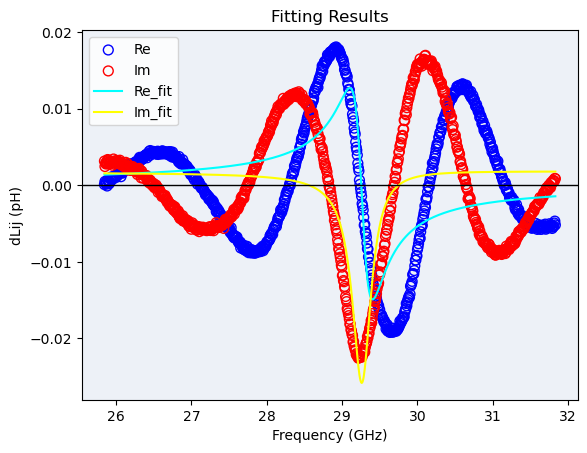


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0042      2.061e-04         U        No
Ai                    -3.885e-04      2.061e-04         U        No
fo                       29.2686         0.0100       GHz        No
df                        0.1511         0.0100       GHz        No
re0                    1.768e-04      2.624e-04         U        No
im0                       0.0017      2.624e-04         U        No
----------------------------------------------------------------------
Index= 51, Guide freq.=28.34856498061341


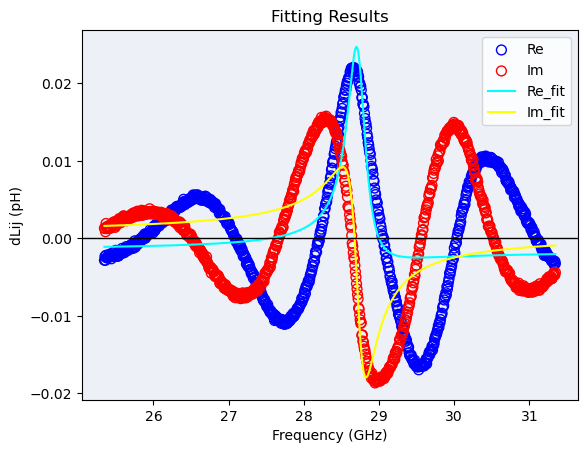


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0014      1.976e-04         U        No
Ai                        0.0037      1.976e-04         U        No
fo                       28.7280         0.0097       GHz        No
df                        0.1460         0.0097       GHz        No
re0                      -0.0016      2.561e-04         U        No
im0                    5.339e-04      2.561e-04         U        No
----------------------------------------------------------------------
Index= 52, Guide freq.=27.876644609473956


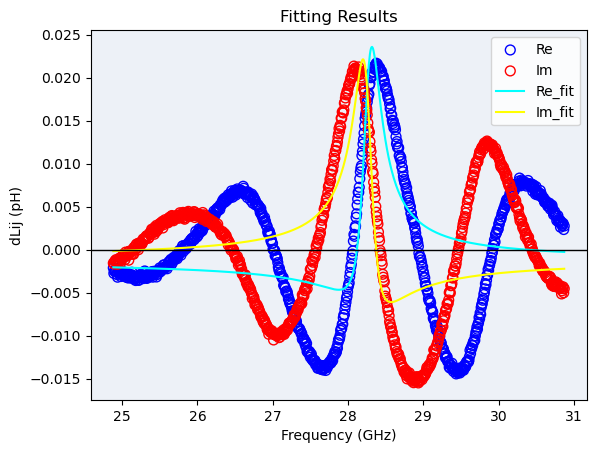


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0026      1.902e-04         U        No
Ai                        0.0031      1.902e-04         U        No
fo                       28.2652         0.0090       GHz        No
df                        0.1424         0.0090       GHz        No
re0                      -0.0013      2.499e-04         U        No
im0                      -0.0011      2.499e-04         U        No
----------------------------------------------------------------------
Index= 53, Guide freq.=27.40271067435582


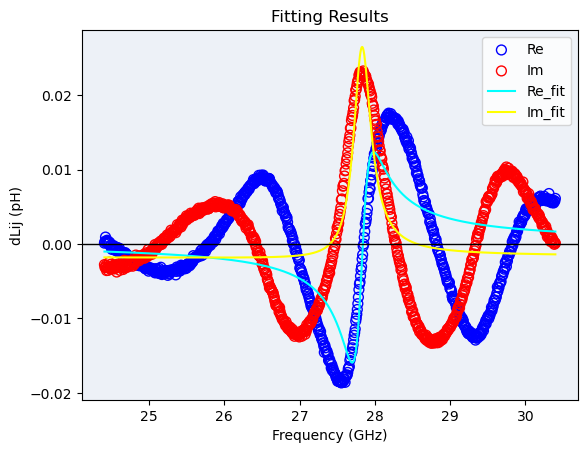


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0040      1.856e-04         U        No
Ai                    -5.472e-04      1.856e-04         U        No
fo                       27.8218         0.0088       GHz        No
df                        0.1411         0.0088       GHz        No
re0                    1.542e-04      2.450e-04         U        No
im0                      -0.0017      2.450e-04         U        No
----------------------------------------------------------------------
Index= 54, Guide freq.=26.90771172333999


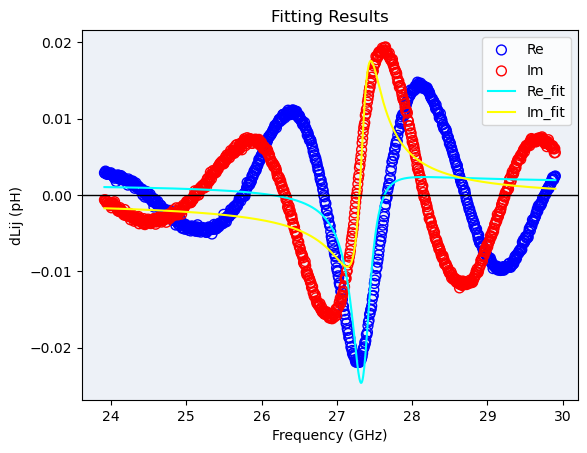


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0014      1.880e-04         U        No
Ai                       -0.0037      1.880e-04         U        No
fo                       27.3501         0.0093       GHz        No
df                        0.1469         0.0093       GHz        No
re0                       0.0015      2.430e-04         U        No
im0                   -6.811e-04      2.430e-04         U        No
----------------------------------------------------------------------
Index= 55, Guide freq.=26.431823151927713


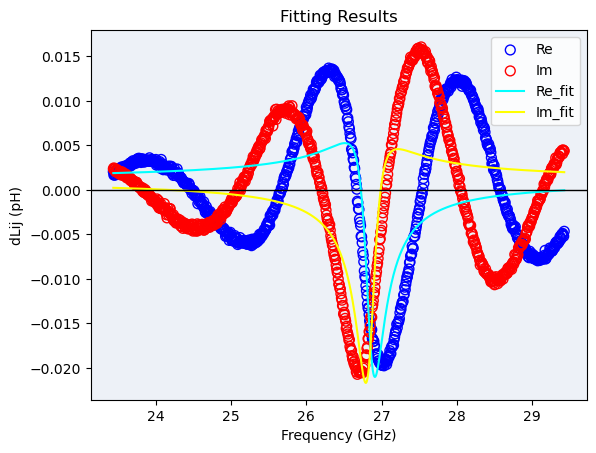


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0028      1.836e-04         U        No
Ai                       -0.0026      1.836e-04         U        No
fo                       26.8479         0.0094       GHz        No
df                        0.1463         0.0094       GHz        No
re0                       0.0011      2.376e-04         U        No
im0                       0.0010      2.376e-04         U        No
----------------------------------------------------------------------
Index= 56, Guide freq.=25.955535613722276


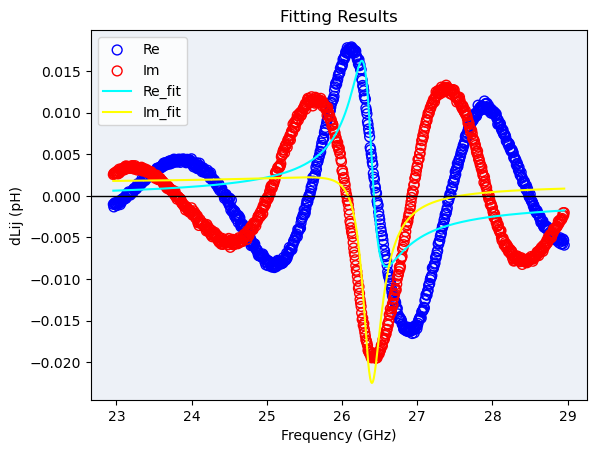


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0035      1.853e-04         U        No
Ai                        0.0013      1.853e-04         U        No
fo                       26.3704         0.0100       GHz        No
df                        0.1522         0.0100       GHz        No
re0                   -4.358e-04      2.349e-04         U        No
im0                       0.0014      2.349e-04         U        No
----------------------------------------------------------------------
Index= 57, Guide freq.=25.45889023323845


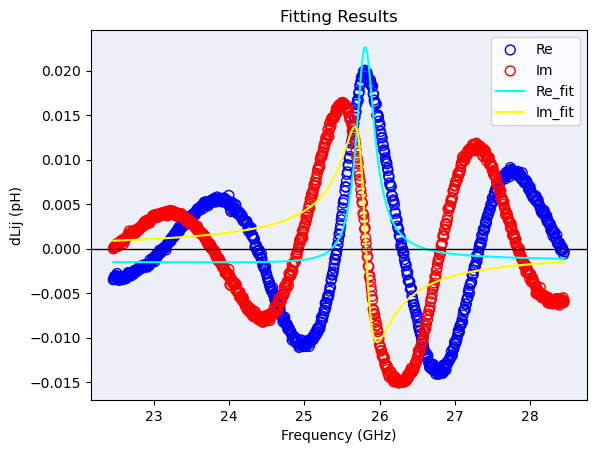


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     5.240e-04      1.810e-04         U        No
Ai                        0.0035      1.810e-04         U        No
fo                       25.7990         0.0100       GHz        No
df                        0.1478         0.0100       GHz        No
re0                      -0.0014      2.331e-04         U        No
im0                   -1.845e-04      2.331e-04         U        No
----------------------------------------------------------------------
Index= 58, Guide freq.=25.001051885744104


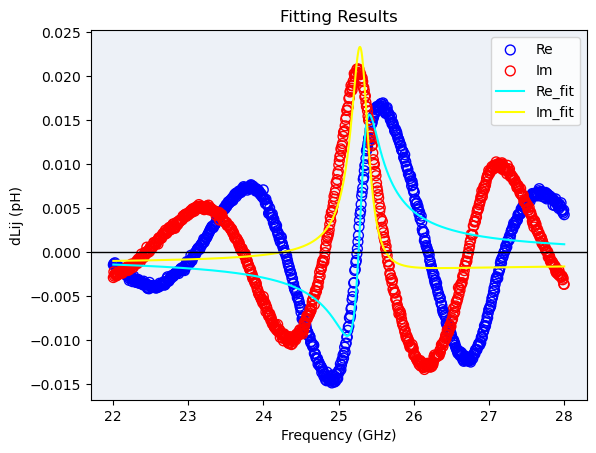


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0034      1.743e-04         U        No
Ai                     9.708e-04      1.743e-04         U        No
fo                       25.3032         0.0093       GHz        No
df                        0.1415         0.0093       GHz        No
re0                   -3.865e-04      2.298e-04         U        No
im0                      -0.0013      2.298e-04         U        No
----------------------------------------------------------------------
Index= 59, Guide freq.=24.481373114957044


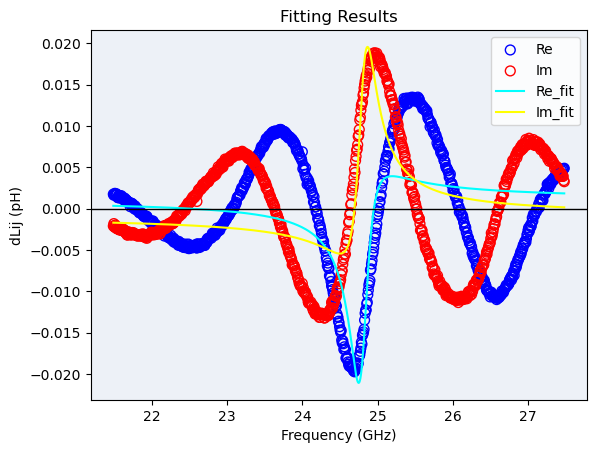


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0023      1.742e-04         U        No
Ai                       -0.0027      1.742e-04         U        No
fo                       24.7979         0.0093       GHz        No
df                        0.1419         0.0093       GHz        No
re0                       0.0011      2.293e-04         U        No
im0                   -9.047e-04      2.293e-04         U        No
----------------------------------------------------------------------
Index= 60, Guide freq.=23.998205359559567


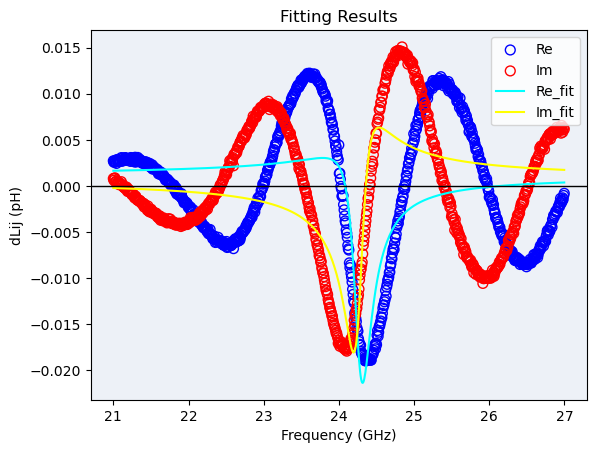


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0019      1.742e-04         U        No
Ai                       -0.0029      1.742e-04         U        No
fo                       24.2736         0.0096       GHz        No
df                        0.1428         0.0096       GHz        No
re0                       0.0011      2.284e-04         U        No
im0                    6.989e-04      2.284e-04         U        No
----------------------------------------------------------------------
Index= 61, Guide freq.=23.50983442243394


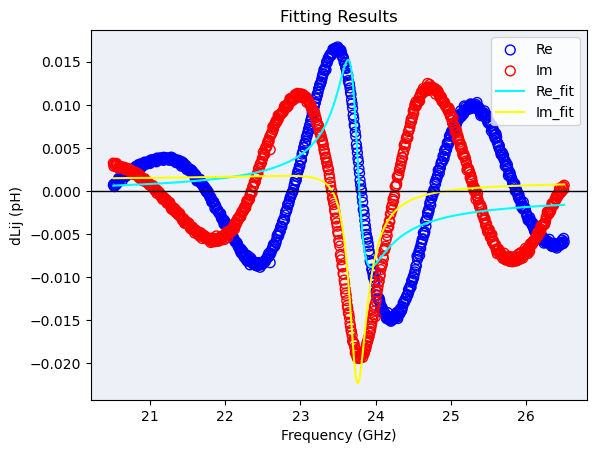


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0033      1.731e-04         U        No
Ai                        0.0011      1.731e-04         U        No
fo                       23.7410         0.0096       GHz        No
df                        0.1455         0.0096       GHz        No
re0                   -4.165e-04      2.248e-04         U        No
im0                       0.0012      2.248e-04         U        No
----------------------------------------------------------------------
Index= 62, Guide freq.=22.993179256859623


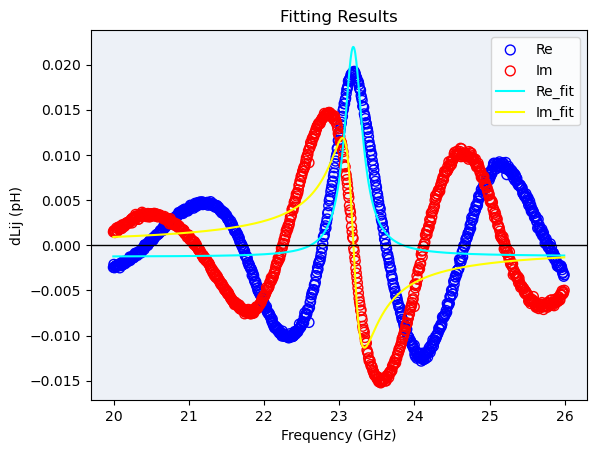


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     1.217e-04      1.690e-04         U        No
Ai                        0.0034      1.690e-04         U        No
fo                       23.1846         0.0098       GHz        No
df                        0.1458         0.0098       GHz        No
re0                      -0.0012      2.192e-04         U        No
im0                   -1.441e-04      2.192e-04         U        No
----------------------------------------------------------------------
Index= 63, Guide freq.=22.486941074301942


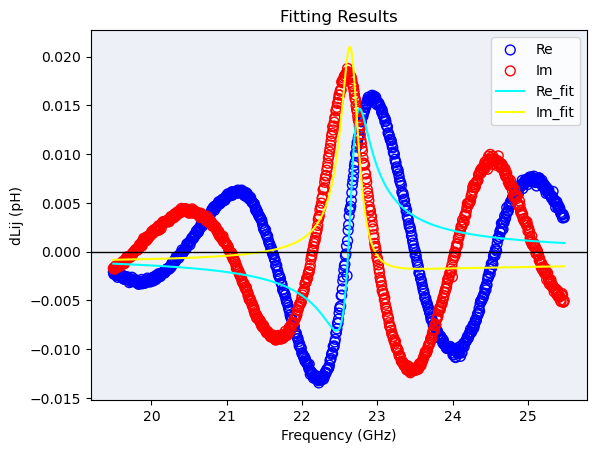


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0032      1.648e-04         U        No
Ai                        0.0010      1.648e-04         U        No
fo                       22.6589         0.0097       GHz        No
df                        0.1462         0.0097       GHz        No
re0                   -2.537e-04      2.136e-04         U        No
im0                      -0.0012      2.136e-04         U        No
----------------------------------------------------------------------
Index= 64, Guide freq.=21.967881145288306


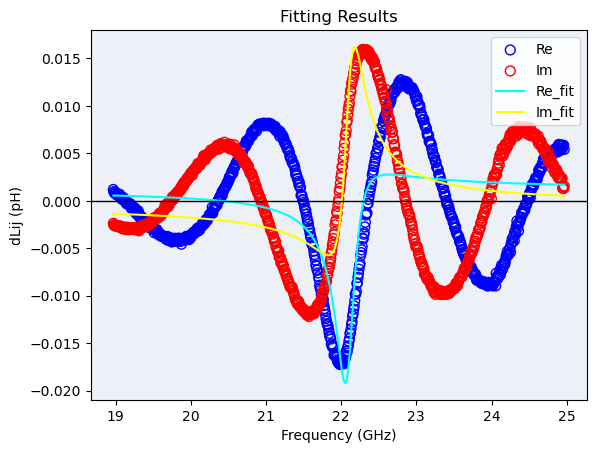


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0017      1.629e-04         U        No
Ai                       -0.0028      1.629e-04         U        No
fo                       22.0965         0.0099       GHz        No
df                        0.1506         0.0099       GHz        No
re0                       0.0012      2.078e-04         U        No
im0                   -4.888e-04      2.078e-04         U        No
----------------------------------------------------------------------
Index= 65, Guide freq.=21.410541104332758


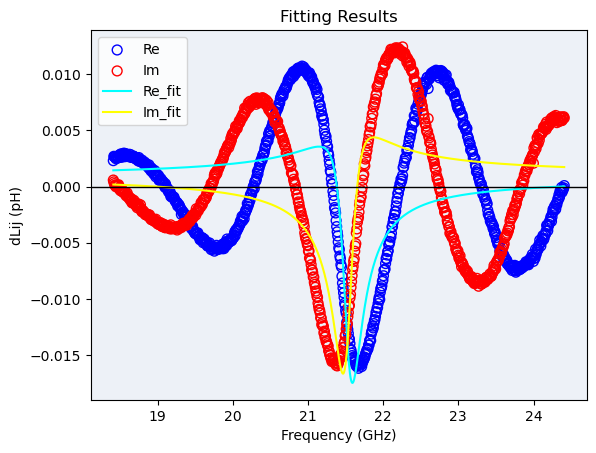


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0021      1.579e-04         U        No
Ai                       -0.0023      1.579e-04         U        No
fo                       21.5331         0.0100       GHz        No
df                        0.1509         0.0100       GHz        No
re0                    7.930e-04      2.011e-04         U        No
im0                    9.577e-04      2.011e-04         U        No
----------------------------------------------------------------------
Index= 66, Guide freq.=20.856734023407547


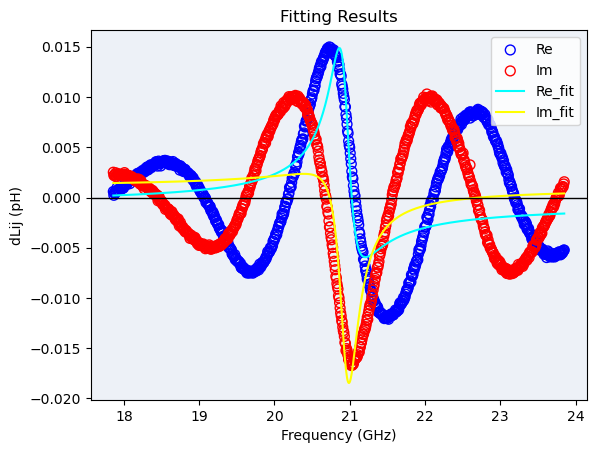


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0027      1.520e-04         U        No
Ai                        0.0015      1.520e-04         U        No
fo                       20.9500         0.0098       GHz        No
df                        0.1490         0.0098       GHz        No
re0                   -6.965e-04      1.950e-04         U        No
im0                    9.825e-04      1.950e-04         U        No
----------------------------------------------------------------------
Index= 67, Guide freq.=20.257729384049114


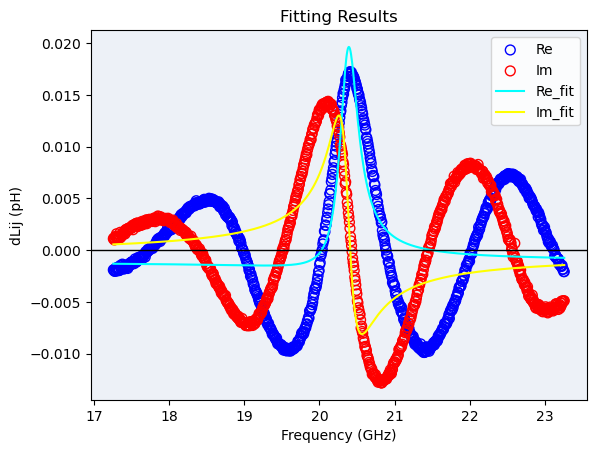


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     8.477e-04      1.486e-04         U        No
Ai                        0.0030      1.486e-04         U        No
fo                       20.3713         0.0094       GHz        No
df                        0.1475         0.0094       GHz        No
re0                      -0.0011      1.916e-04         U        No
im0                   -4.168e-04      1.916e-04         U        No
----------------------------------------------------------------------
Index= 68, Guide freq.=19.6595532309057


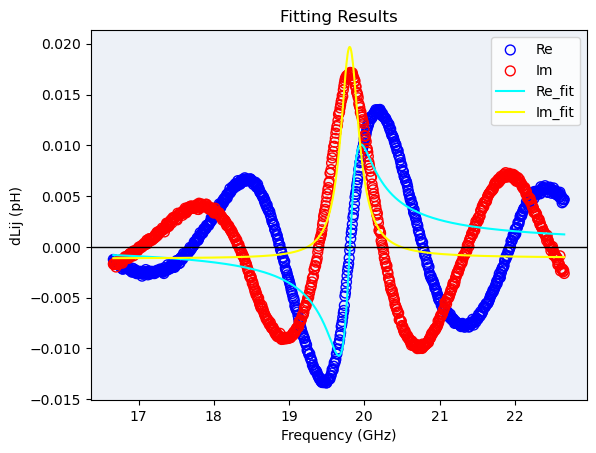


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0030      1.444e-04         U        No
Ai                    -1.413e-04      1.444e-04         U        No
fo                       19.8015         0.0093       GHz        No
df                        0.1466         0.0093       GHz        No
re0                    1.641e-04      1.869e-04         U        No
im0                      -0.0011      1.869e-04         U        No
----------------------------------------------------------------------
Index= 69, Guide freq.=19.037600870242343


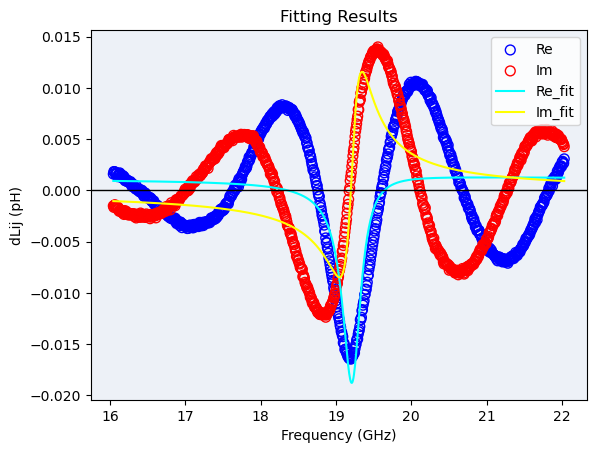


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     4.953e-04      1.409e-04         U        No
Ai                       -0.0029      1.409e-04         U        No
fo                       19.2218         0.0094       GHz        No
df                        0.1477         0.0094       GHz        No
re0                       0.0011      1.817e-04         U        No
im0                   -1.331e-04      1.817e-04         U        No
----------------------------------------------------------------------
Index= 70, Guide freq.=18.391674135709675


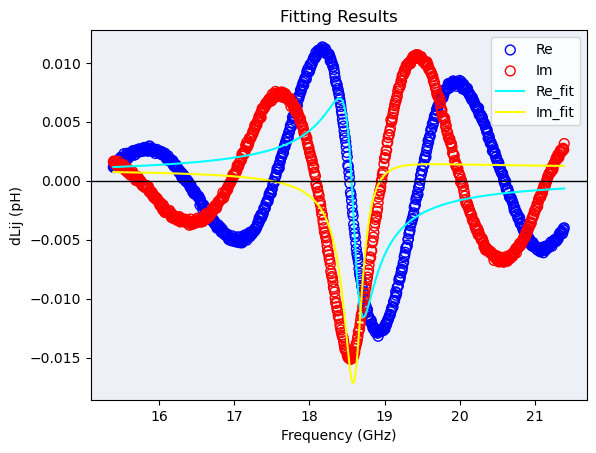


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0027      1.394e-04         U        No
Ai                    -8.004e-04      1.394e-04         U        No
fo                       18.6029         0.0100       GHz        No
df                        0.1524         0.0100       GHz        No
re0                    3.261e-04      1.767e-04         U        No
im0                       0.0010      1.767e-04         U        No
----------------------------------------------------------------------
Index= 71, Guide freq.=17.69421994568821


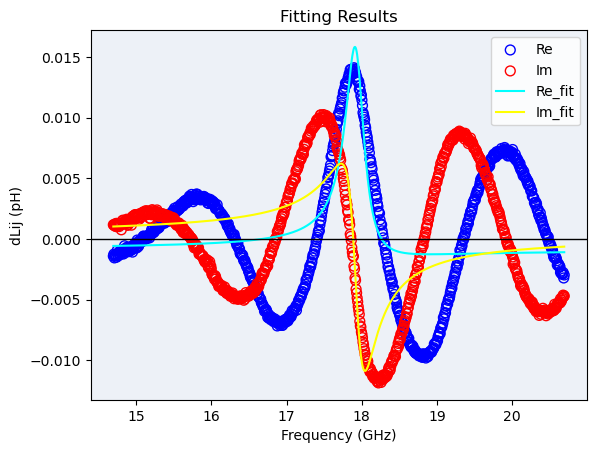


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                    -7.925e-04      1.345e-04         U        No
Ai                        0.0025      1.345e-04         U        No
fo                       17.9321         0.0105       GHz        No
df                        0.1518         0.0105       GHz        No
re0                   -8.543e-04      1.709e-04         U        No
im0                    2.779e-04      1.709e-04         U        No
----------------------------------------------------------------------
Index= 72, Guide freq.=17.00292029522528


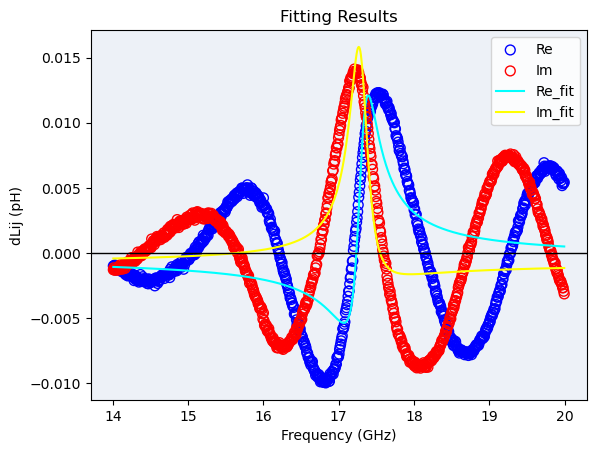


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0023      1.275e-04         U        No
Ai                        0.0011      1.275e-04         U        No
fo                       17.2999         0.0098       GHz        No
df                        0.1473         0.0098       GHz        No
re0                   -3.790e-04      1.645e-04         U        No
im0                   -7.858e-04      1.645e-04         U        No
----------------------------------------------------------------------
Index= 73, Guide freq.=16.263034271343084


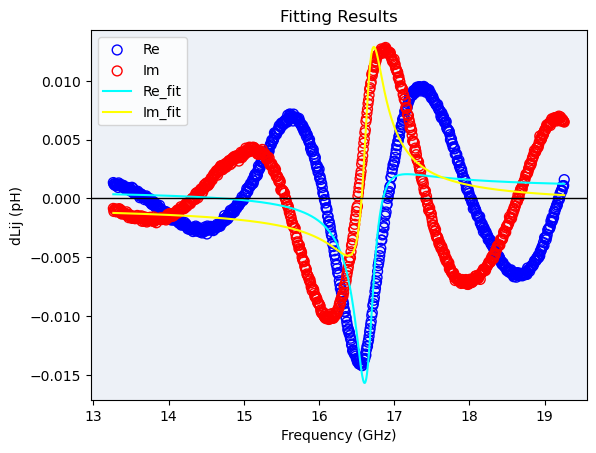


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0013      1.237e-04         U        No
Ai                       -0.0022      1.237e-04         U        No
fo                       16.6463         0.0093       GHz        No
df                        0.1460         0.0093       GHz        No
re0                    7.817e-04      1.603e-04         U        No
im0                   -5.924e-04      1.603e-04         U        No
----------------------------------------------------------------------
Index= 74, Guide freq.=15.536727629613395


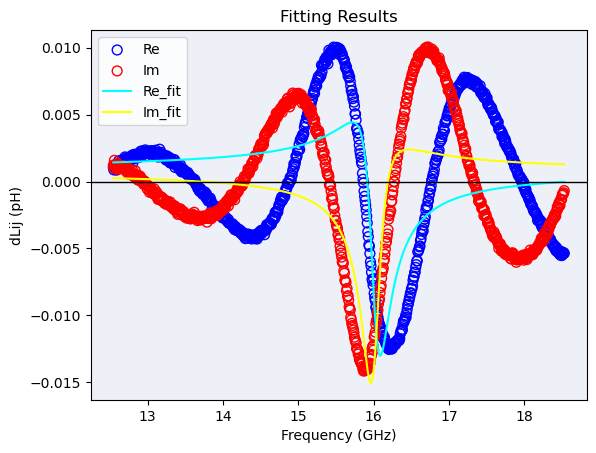


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0021      1.232e-04         U        No
Ai                       -0.0015      1.232e-04         U        No
fo                       16.0123         0.0094       GHz        No
df                        0.1495         0.0094       GHz        No
re0                    8.407e-04      1.577e-04         U        No
im0                    7.175e-04      1.577e-04         U        No
----------------------------------------------------------------------
Index= 75, Guide freq.=14.765686023846795


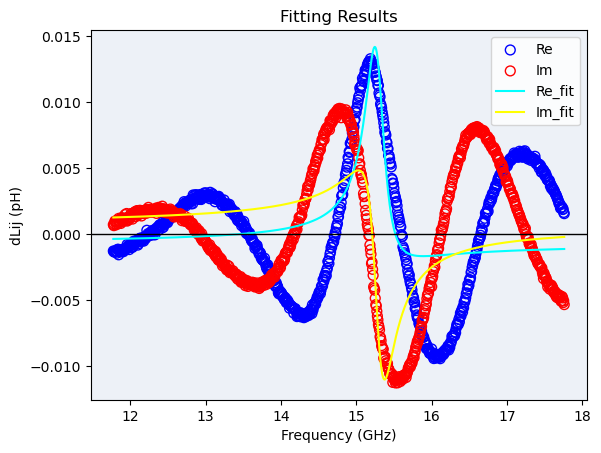


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0012      1.217e-04         U        No
Ai                        0.0021      1.217e-04         U        No
fo                       15.2840         0.0103       GHz        No
df                        0.1527         0.0103       GHz        No
re0                   -7.401e-04      1.540e-04         U        No
im0                    6.486e-04      1.540e-04         U        No
----------------------------------------------------------------------
Index= 76, Guide freq.=14.0107939040987


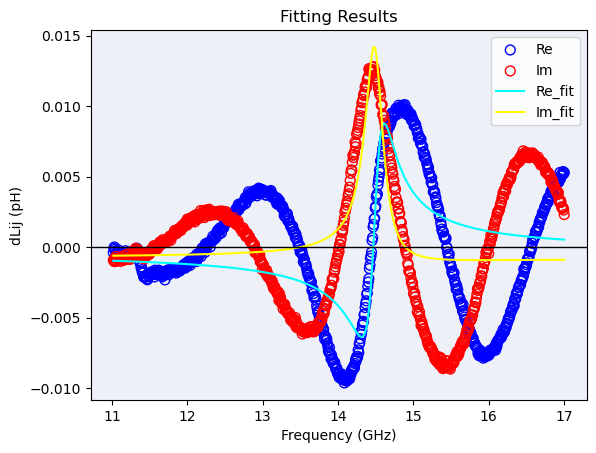


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                        0.0022      1.145e-04         U        No
Ai                     4.539e-04      1.145e-04         U        No
fo                       14.4948         0.0101       GHz        No
df                        0.1476         0.0101       GHz        No
re0                   -3.438e-04      1.475e-04         U        No
im0                   -7.630e-04      1.475e-04         U        No
----------------------------------------------------------------------
Index= 77, Guide freq.=13.234638598289576


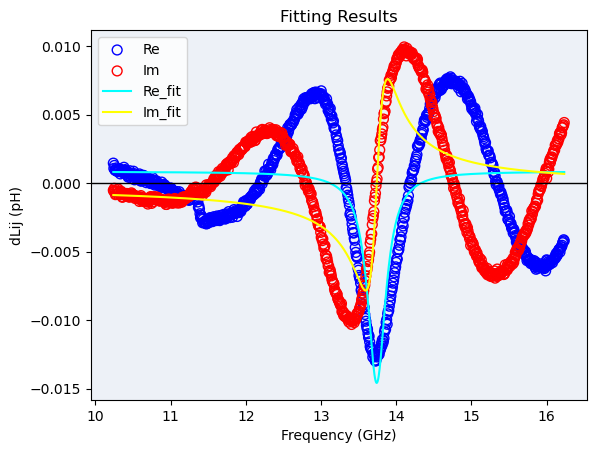


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     3.094e-05      1.087e-04         U        No
Ai                       -0.0023      1.087e-04         U        No
fo                       13.7408         0.0094       GHz        No
df                        0.1460         0.0094       GHz        No
re0                    8.498e-04      1.408e-04         U        No
im0                   -2.254e-04      1.408e-04         U        No
----------------------------------------------------------------------
Index= 78, Guide freq.=12.383827105906441


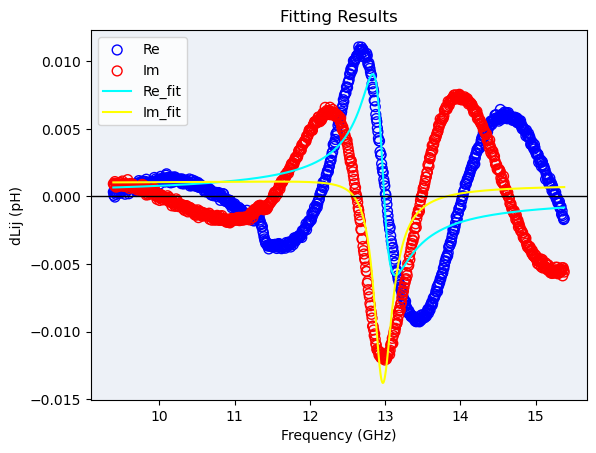


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                       -0.0022      1.023e-04         U        No
Ai                     4.573e-04      1.023e-04         U        No
fo                       12.9542         0.0092       GHz        No
df                        0.1476         0.0092       GHz        No
re0                    5.460e-05      1.318e-04         U        No
im0                    9.360e-04      1.318e-04         U        No
----------------------------------------------------------------------
Index= 79, Guide freq.=11.526081496494163


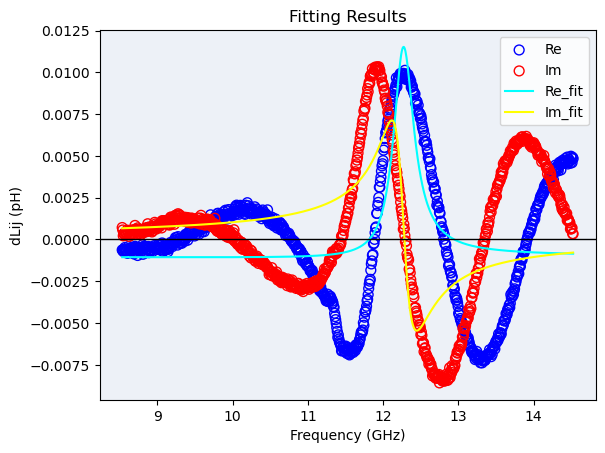


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                     2.381e-04      1.029e-04         U        No
Ai                        0.0021      1.029e-04         U        No
fo                       12.2616         0.0109       GHz        No
df                        0.1650         0.0109       GHz        No
re0                      -0.0010      1.247e-04         U        No
im0                    1.171e-04      1.247e-04         U        No
----------------------------------------------------------------------
Index= 80, Guide freq.=10.480959211774236


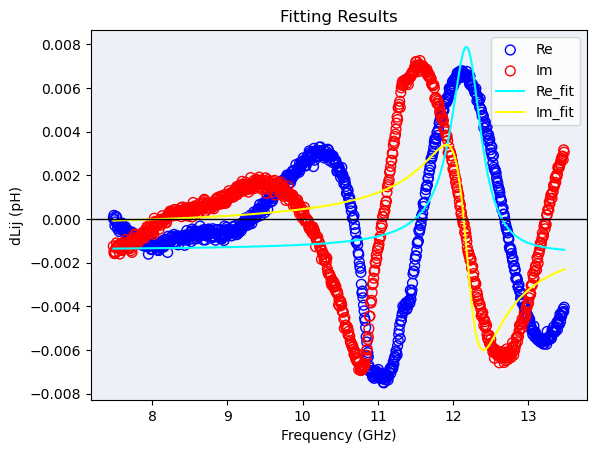


Fit Results
----------------------------------------------------------------------
Parameter                  Value        ± Error      Unit     Fixed
----------------------------------------------------------------------
Ar                    -3.670e-04      1.128e-04         U        No
Ai                        0.0023      1.128e-04         U        No
fo                       12.1952         0.0151       GHz        No
df                        0.2437         0.0151       GHz        No
re0                      -0.0015      1.079e-04         U        No
im0                   -5.534e-04      1.079e-04         U        No
----------------------------------------------------------------------


In [24]:
est_gamma = 28.8 #GHz/T
HD_T = 2.05#T
HK_T = 120*1e-6#T
Hex_T = 1000#T

for i in range(len(ansy1.calc_field("inP"))):
    H_index = i
    freq = res_func.hematite_modes(ansy1.calc_field("inP")[H_index], est_gamma, 10e-6, HD_T, HK_T, Hex_T)["FMR"]
    
    
    print(f"Index= {i}, Guide freq.={freq}")
    ini_vals = [1, 1, freq, 0.028, 0, 0] #A, w, fres, fper, fref, re0, im0

    
    f_min, f_max = freq-3, freq+3 #GHz
    f_array = ansy1.freqs
    y_array_re, y_array_im = ansy1.d_S("21R")[H_index], ansy1.d_S("21I")[H_index]
    
    model = models.ComplexLorentzian_freq()
    fitter = fits.ComplexFitter( ini_vals, f_min, f_max,
        f_array, y_array_re , y_array_im, model)
    fitter.fix(fo=freq, df=0.2, re0=0, im0=0) # Parameters to be fixed, empty otherwise
    opt_p0 = fitter.simplex_wpm(method='Nelder-Mead')#'Powell'
    #print(opt_p0)
    #fitter.plot_fit_simplex_wpm()
    new_p0 = np.array(list(opt_p0.values()), dtype=float)
    fitter.update_p0(new_p0)
    
    params, cov = fitter.fit(simplex_b=False)
    fitter.plot_fit()
    fitter.summary()
    fit_dict = fitter.export_fit_dict()
    fits_storage.save(index=H_index,field=float(ansy1.calc_field("inP")[H_index]),fit_dict=fit_dict)

In [25]:
#Realoading parameters

In [26]:
data_L_fits = fits_storage.load_fit_results(newFile, group="Lorentzian fitting")

In [27]:
fits_storage.plot_fit_parameters_subplots(
    data_L_fits,
    x_axis="index",
    params=["df", "fo"],
    x_label= "index"#"μ₀H (T)"
)

In [28]:
cut_data_L_fits = fits_storage.slice_dict(data_L_fits, 15, 72)

In [29]:
#Plotting of fitted parameters